## Analyzing the Impact of External Factors on Retail Store Sales: A Regression Analysis

### Introduction
In the dynamic landscape of retail, understanding the myriad factors that drive store sales has become paramount for businesses aiming to achieve sustained growth and profitability. Sales performance could be influenced not only by internal strategies and product offerings but also by a complex interplay of external factors. These external variables, ranging from economic indicators and climatic conditions to holidays and marketing endeavors, can exert substantial influence on consumer behavior and purchasing patterns. As the retail industry continues to evolve, there is a pressing need to uncover the relationships between these external factors and store sales with a higher degree of precision. This study aims to contribute to this understanding through a rigorous regression analysis, offering insights that can empower retail companies to make informed decisions and optimize their strategies for enhanced sales outcomes.

### Problem Statement
The central problem under investigation in this study is to ascertain the extent to which external factors impact the sales performance of retail stores. While it is widely acknowledged that both internal and external factors contribute to sales fluctuations, there remains a gap in comprehending the specific nature and magnitude of these external influences. Existing research has shown that factors such as economic indicators, weather variations, promotional campaigns, and cultural events can impact consumer spending behavior. However, there is a lack of comprehensive empirical analysis that quantifies the relationships between these external variables and store sales within a unified framework.

### Aim of Project
The aim of this project is to investigate how certain external factors such as oil prices, holiday-events, and natural ocurrances impact the sales of products of Favorita Retail Stores in Ecuador.

## Set Up The Project Environment

Install the necessary Python libraries: pandas, numpy, scikit-learn, matplotlib, and any specific time series libraries like statsmodels.

In [1]:
# Load the libraries/modules

# For data manipulation and cleaning
import pandas as pd # a tool for data analysis and manipulation.
import numpy as np # a tool for numerical computations.
from datetime import datetime

# For data visualizations
import matplotlib.pyplot as plt # a tool for ploting graphs/charts.
import plotly.express as px
import seaborn as sns # a tool built on matplotlib for plotting graphs/charts.

# For imputing missing values
from sklearn.impute import SimpleImputer

# For encoding numerical, categorical data, creating a pipeline and converting back to Dataframe
from sklearn.preprocessing import OneHotEncoder,MinMaxScaler


# For Statistical analysis and testing
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose

# Perform Stationarity Test
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.stattools import adfuller

# For model selections and modeling

from sklearn.metrics import mean_squared_log_error, mean_squared_error
import phik
from sklearn.model_selection import GridSearchCV 
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
from sklearn.tree import DecisionTreeRegressor
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from math import sqrt
from scipy.stats import f_oneway

# Other supporting libraries
import random
import pyodbc #  helps in making access to SQL Server database simple.
from dotenv import dotenv_values # helps to get login credential to the database.

import warnings # Hiding not too major the warnings.
warnings.filterwarnings('ignore')


## Step 3: Data Preprocessing

Load the dataset into a pandas DataFrame.
Check for missing values and decide on a strategy to handle them (e.g., interpolation or filling with zeros).
Set the timestamp column as the index and convert it to a datetime format.
Explore the data to understand its characteristics, seasonality, and trends.

#### Loading the Datasets

In [2]:
# Create an environment to store sentitive information
environment_variables = dotenv_values('.env')

database_name = environment_variables.get('DATABASE')
server_name   = environment_variables.get('SERVER')
user_name     = environment_variables.get('UID')
password      = environment_variables.get('PWD')

connection_string = f'DRIVER={{SQL Server}};DATABASE={database_name};SERVER={server_name};UID={user_name};PWD={password};'

In [3]:
# Connecting to the Database
connection = pyodbc.connect(connection_string)

In [4]:
# Loading the data in pandas to work on.

# Queries to retrieve tables from the Database dapDB
query1 ='SELECT * FROM dbo.oil'
query2 ='SELECT * FROM dbo.holidays_events'
query3 ='SELECT * FROM dbo.stores'

#Loading the data from the Database dapDB
oil_data = pd.read_sql(query1, connection)
holi_eve_data = pd.read_sql(query2, connection)
stores_data = pd.read_sql(query3, connection)

#Loading the two data stored in Onedrive
sample_sub_data = pd.read_csv(r'C:\Users\etnketiah\Documents\Azubi\New project\Lp3pro\sample_submission.csv')
test_data = pd.read_csv(r'C:\Users\etnketiah\Documents\Azubi\New project\Lp3pro\test.csv')

# Loading the two data stored in GitHub
train_data = pd.read_csv(r'C:\Users\etnketiah\Documents\Azubi\New project\Lp3pro\train.csv')
transc_data = pd.read_csv(r'C:\Users\etnketiah\Documents\Azubi\New project\Lp3pro\transactions.csv')

In [5]:
# Save 'oil_data' DataFrame to a CSV file
oil_data.to_csv('oil_data.csv', index=False)

# Save 'holi_eve_data' DataFrame to a CSV file
holi_eve_data.to_csv('holidays_events_data.csv', index=False)

# Save 'stores_data' DataFrame to a CSV file
stores_data.to_csv('stores_data.csv', index=False)


#### Exploratory Analysis on the loaded datasets

Oil Data

In [6]:
oil_data.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.139999
2,2013-01-03,92.970001
3,2013-01-04,93.120003
4,2013-01-07,93.199997


In [7]:
oil_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        1218 non-null   object 
 1   dcoilwtico  1175 non-null   float64
dtypes: float64(1), object(1)
memory usage: 19.2+ KB


In [8]:
oil_data.isna().sum()

date           0
dcoilwtico    43
dtype: int64

In [9]:
# Check for duplicated rows in the oil_data DataFrame
oil_data.duplicated().sum()



0

Holiday Event Data

In [10]:
holi_eve_data.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [11]:
holi_eve_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   date         350 non-null    object
 1   type         350 non-null    object
 2   locale       350 non-null    object
 3   locale_name  350 non-null    object
 4   description  350 non-null    object
 5   transferred  350 non-null    bool  
dtypes: bool(1), object(5)
memory usage: 14.1+ KB


In [12]:
holi_eve_data.isna().sum()

date           0
type           0
locale         0
locale_name    0
description    0
transferred    0
dtype: int64

Stores Data

In [13]:
stores_data.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [14]:
stores_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


In [15]:
stores_data.isna().sum()

store_nbr    0
city         0
state        0
type         0
cluster      0
dtype: int64

Sample Data

In [16]:
sample_sub_data.head()

,id,sales
0,3000888,0.0
1,3000889,0.0
2,3000890,0.0
3,3000891,0.0
4,3000892,0.0


In [17]:
sample_sub_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      28512 non-null  int64  
 1   sales   28512 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 445.6 KB


In [18]:
sample_sub_data.isna().sum()

id       0
sales    0
dtype: int64

Test Data

In [19]:
test_data.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [20]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           28512 non-null  int64 
 1   date         28512 non-null  object
 2   store_nbr    28512 non-null  int64 
 3   family       28512 non-null  object
 4   onpromotion  28512 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 1.1+ MB


In [21]:
test_data.isna().sum()

id             0
date           0
store_nbr      0
family         0
onpromotion    0
dtype: int64

Transaction Data

In [22]:
transc_data.head()

,date,store_nbr,transactions
0,2013-01-01,25,770.0
1,2013-01-02,1,2111.0
2,2013-01-02,2,2358.0
3,2013-01-02,3,3487.0
4,2013-01-02,4,1922.0


In [23]:
transc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6446 entries, 0 to 6445
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          6446 non-null   object 
 1   store_nbr     6446 non-null   int64  
 2   transactions  6445 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 151.2+ KB


In [24]:
transc_data.isna().sum()

date            0
store_nbr       0
transactions    1
dtype: int64

Train Data

In [25]:
train_data.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [26]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   date         object 
 2   store_nbr    int64  
 3   family       object 
 4   sales        float64
 5   onpromotion  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.4+ MB


In [27]:
train_data.isna().sum()

id             0
date           0
store_nbr      0
family         0
sales          0
onpromotion    0
dtype: int64

work on null values in oil and transaction

In [28]:
oil_data.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.139999
2,2013-01-03,92.970001
3,2013-01-04,93.120003
4,2013-01-07,93.199997


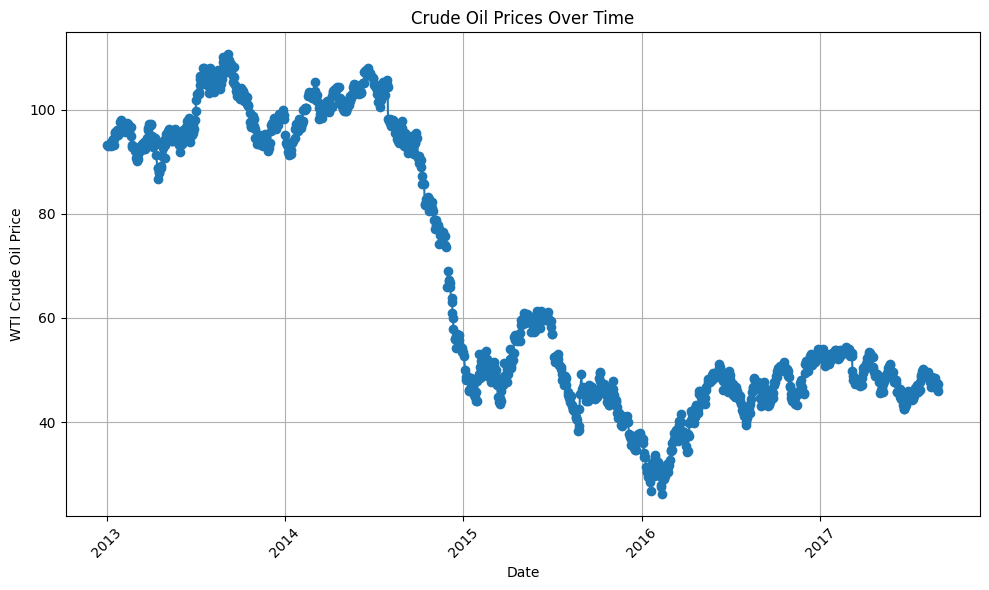

In [29]:


# Assuming oil_data contains the data you provided
# Convert the 'date' column to datetime for proper plotting
oil_data['date'] = pd.to_datetime(oil_data['date'])

# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(oil_data['date'], oil_data['dcoilwtico'], marker='o', linestyle='-')
plt.title('Crude Oil Prices Over Time')
plt.xlabel('Date')
plt.ylabel('WTI Crude Oil Price')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


In [30]:
# Filter the DataFrame to get rows with NaN values in the 'dcoilwtico' column
missing_dates = oil_data[oil_data['dcoilwtico'].isna()]

# Print the individual dates with NaN values
print("Dates with NaN values:")
print(missing_dates[['date', 'dcoilwtico']])


Dates with NaN values:
           date  dcoilwtico
0    2013-01-01         NaN
14   2013-01-21         NaN
34   2013-02-18         NaN
63   2013-03-29         NaN
104  2013-05-27         NaN
132  2013-07-04         NaN
174  2013-09-02         NaN
237  2013-11-28         NaN
256  2013-12-25         NaN
261  2014-01-01         NaN
274  2014-01-20         NaN
294  2014-02-17         NaN
338  2014-04-18         NaN
364  2014-05-26         NaN
393  2014-07-04         NaN
434  2014-09-01         NaN
497  2014-11-27         NaN
517  2014-12-25         NaN
522  2015-01-01         NaN
534  2015-01-19         NaN
554  2015-02-16         NaN
588  2015-04-03         NaN
624  2015-05-25         NaN
653  2015-07-03         NaN
699  2015-09-07         NaN
757  2015-11-26         NaN
778  2015-12-25         NaN
783  2016-01-01         NaN
794  2016-01-18         NaN
814  2016-02-15         NaN
843  2016-03-25         NaN
889  2016-05-30         NaN
914  2016-07-04         NaN
959  2016-09-05         N

Just a few were holidays so we will use forward fill to fill the NAN values


In [31]:


# Sort the DataFrame by date (if it's not already sorted)
oil_data.sort_values(by='date', inplace=True)

# Fill NaN values in the 'dcoilwtico' column using forward-fill (pad)
oil_data['dcoilwtico'].fillna(method='ffill', inplace=True)

# Display the DataFrame with filled NaN values
print(oil_data)


           date  dcoilwtico
0    2013-01-01         NaN
1    2013-01-02   93.139999
2    2013-01-03   92.970001
3    2013-01-04   93.120003
4    2013-01-07   93.199997
...         ...         ...
1213 2017-08-25   47.650002
1214 2017-08-28   46.400002
1215 2017-08-29   46.459999
1216 2017-08-30   45.959999
1217 2017-08-31   47.259998

[1218 rows x 2 columns]


In [32]:

# Create a date range from the earliest date to the latest date in the dataset
earliest_date = oil_data['date'].min()
latest_date = oil_data['date'].max()
date_range = pd.date_range(start=earliest_date, end=latest_date)

# Find the missing dates by subtracting the existing dates from the full date range
missing_dates = date_range[~date_range.isin(oil_data['date'])]

# Print the missing dates
print("Missing Dates:")
print(missing_dates)


Missing Dates:
DatetimeIndex(['2013-01-05', '2013-01-06', '2013-01-12', '2013-01-13',
               '2013-01-19', '2013-01-20', '2013-01-26', '2013-01-27',
               '2013-02-02', '2013-02-03',
               ...
               '2017-07-29', '2017-07-30', '2017-08-05', '2017-08-06',
               '2017-08-12', '2017-08-13', '2017-08-19', '2017-08-20',
               '2017-08-26', '2017-08-27'],
              dtype='datetime64[ns]', length=486, freq=None)


we realize that all missing dates are weekend dates

In [33]:


# Create a date range from the earliest date to the latest date in the dataset
earliest_date = oil_data['date'].min()
latest_date = oil_data['date'].max()
date_range = pd.date_range(start=earliest_date, end=latest_date)

# Find the missing dates by subtracting the existing dates from the full date range
missing_dates = date_range[~date_range.isin(oil_data['date'])]

# Create a DataFrame for missing dates with 'dcoilwtico' column filled using forward-fill
missing_data = pd.DataFrame({'date': missing_dates})
missing_data['dcoilwtico'] = missing_data['date'].map(oil_data.set_index('date')['dcoilwtico'].fillna(method='ffill'))

# Concatenate the original data with the missing data
oil_data = pd.concat([oil_data, missing_data], ignore_index=True)

# Sort the DataFrame by date
oil_data.sort_values(by='date', inplace=True)

# Display the updated DataFrame
print(oil_data)


           date  dcoilwtico
0    2013-01-01         NaN
1    2013-01-02   93.139999
2    2013-01-03   92.970001
3    2013-01-04   93.120003
1218 2013-01-05         NaN
...         ...         ...
1703 2017-08-27         NaN
1214 2017-08-28   46.400002
1215 2017-08-29   46.459999
1216 2017-08-30   45.959999
1217 2017-08-31   47.259998

[1704 rows x 2 columns]


In [34]:
# Sort the DataFrame by date (if it's not already sorted)
oil_data.sort_values(by='date', inplace=True)

# Fill NaN values in the 'dcoilwtico' column using forward-fill (pad)
oil_data['dcoilwtico'].fillna(method='ffill', inplace=True)

# Display the DataFrame with filled NaN values
print(oil_data)

           date  dcoilwtico
0    2013-01-01         NaN
1    2013-01-02   93.139999
2    2013-01-03   92.970001
3    2013-01-04   93.120003
1218 2013-01-05   93.120003
...         ...         ...
1703 2017-08-27   47.650002
1214 2017-08-28   46.400002
1215 2017-08-29   46.459999
1216 2017-08-30   45.959999
1217 2017-08-31   47.259998

[1704 rows x 2 columns]


In [35]:
# Sort the DataFrame by date (if it's not already sorted)
oil_data.sort_values(by='date', inplace=True)

# Fill NaN values in the 'dcoilwtico' column using forward-fill (pad)
oil_data['dcoilwtico'].fillna(method='bfill', inplace=True)

# Display the DataFrame with filled NaN values
print(oil_data)

           date  dcoilwtico
0    2013-01-01   93.139999
1    2013-01-02   93.139999
2    2013-01-03   92.970001
3    2013-01-04   93.120003
1218 2013-01-05   93.120003
...         ...         ...
1703 2017-08-27   47.650002
1214 2017-08-28   46.400002
1215 2017-08-29   46.459999
1216 2017-08-30   45.959999
1217 2017-08-31   47.259998

[1704 rows x 2 columns]


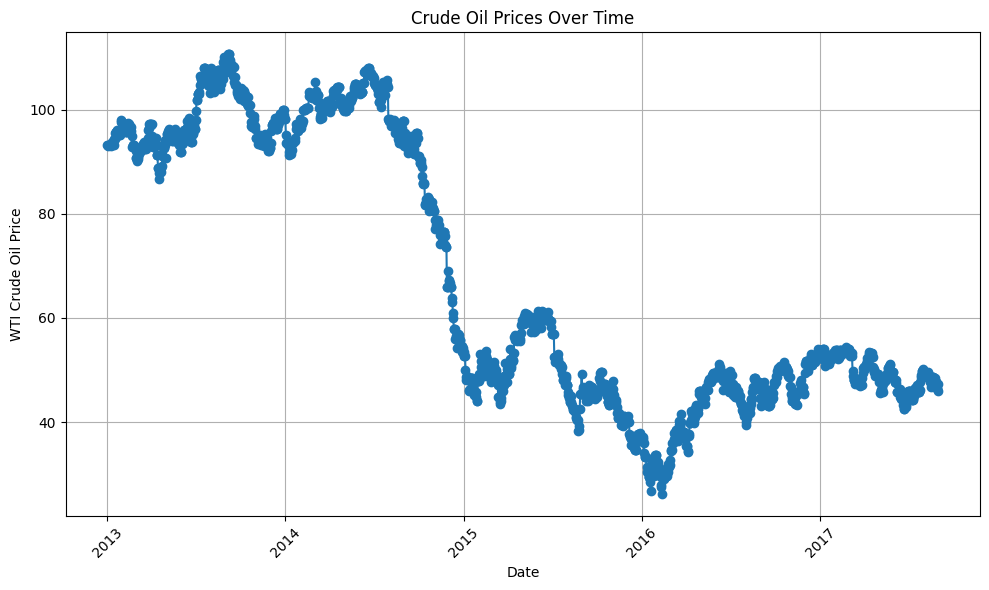

In [36]:



# Convert the 'date' column to datetime for proper plotting
oil_data['date'] = pd.to_datetime(oil_data['date'])

# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(oil_data['date'], oil_data['dcoilwtico'], marker='o', linestyle='-')
plt.title('Crude Oil Prices Over Time')
plt.xlabel('Date')
plt.ylabel('WTI Crude Oil Price')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


In [37]:
oil_data.shape

(1704, 2)

In [38]:
transc_data.shape

(6446, 3)

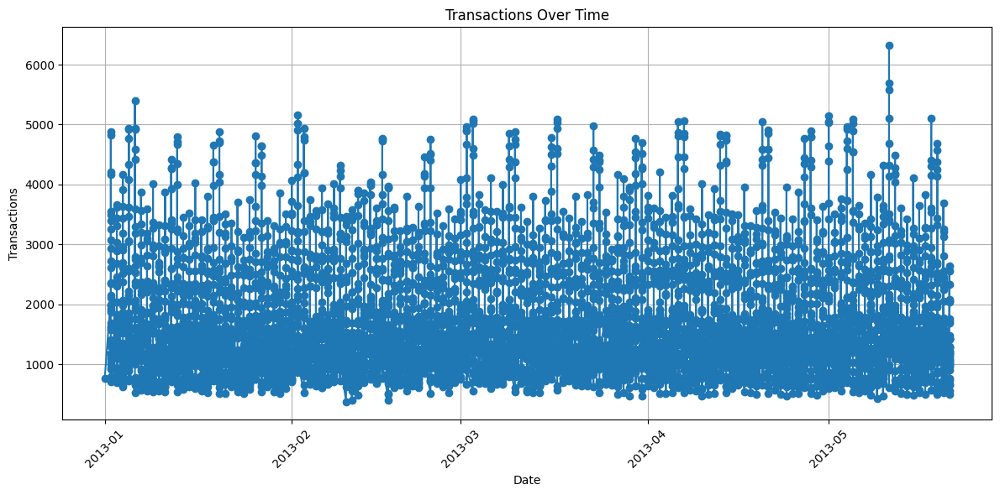

In [39]:


# Assuming transc_data contains your data
# Convert the 'date' column to datetime for proper date handling
transc_data['date'] = pd.to_datetime(transc_data['date'])

# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(transc_data['date'], transc_data['transactions'], marker='o', linestyle='-')
plt.title('Transactions Over Time')
plt.xlabel('Date')
plt.ylabel('Transactions')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


In [40]:
# Convert the 'date' column to datetime if it's not already
transc_data['date'] = pd.to_datetime(transc_data['date'])

# Find the maximum and minimum dates
max_date = transc_data['date'].max()
min_date = transc_data['date'].min()

print("Maximum Date:", max_date)
print("Minimum Date:", min_date)


Maximum Date: 2013-05-21 00:00:00
Minimum Date: 2013-01-01 00:00:00


the data for Transaction spans only between 5 months not in years

#### Changing 'date' to 'datetime' format for holi_eve_data

In [41]:
# Convert the 'date' column to datetime for proper plotting
oil_data['date'] = pd.to_datetime(oil_data['date'])


In [42]:
holi_eve_data.shape

(350, 6)

In [43]:
# Convert the 'date' column to datetime for proper plotting
holi_eve_data['date'] = pd.to_datetime(holi_eve_data['date'])

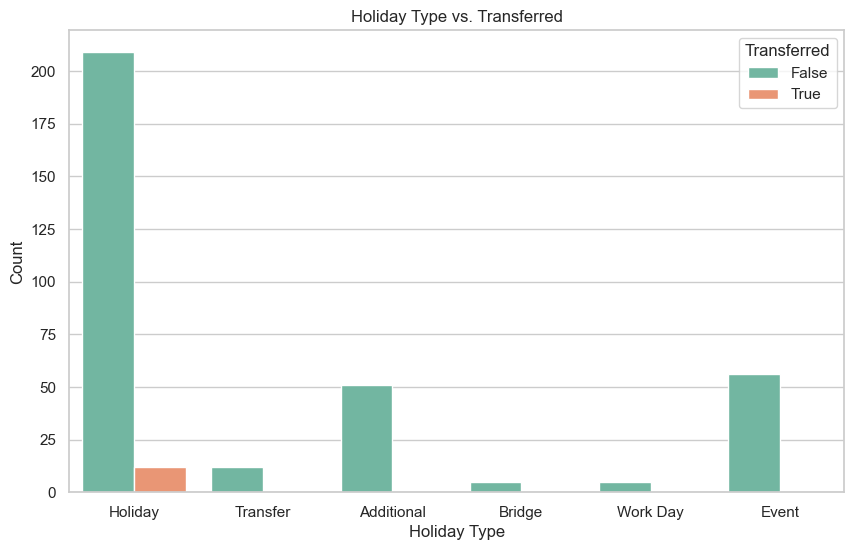

In [44]:
# Create a Seaborn style plot
sns.set(style='whitegrid')
plt.figure(figsize=(10, 6))

# Plot the data using Seaborn
sns.countplot(data=holi_eve_data, x='type', hue='transferred', palette='Set2')
plt.title('Holiday Type vs. Transferred')
plt.xlabel('Holiday Type')
plt.ylabel('Count')
plt.legend(title='Transferred')

# Show the plot
plt.show()

In [45]:

# Filter and list all dates where transferred is True
transferred_dates = holi_eve_data[holi_eve_data['transferred'] == True]['date']

# Print the transferred dates
print("Dates where transferred is True:")
print(transferred_dates)

Dates where transferred is True:
19    2012-10-09
72    2013-10-09
135   2014-10-09
255   2016-05-24
266   2016-07-25
268   2016-08-10
297   2017-01-01
303   2017-04-12
312   2017-05-24
324   2017-08-10
328   2017-09-28
340   2017-12-06
Name: date, dtype: datetime64[ns]


In [46]:
# this is to remove all type which has value holiday and transferred to be false

# Filter and keep only rows where 'type' is not 'Holiday' or 'transferred' is False
filtered_data = holi_eve_data[~((holi_eve_data['type'] == 'Holiday') & (holi_eve_data['transferred'] == True))]

# The resulting 'filtered_data' DataFrame will have rows with 'type'='Holiday' and 'transferred'=True removed.


In [47]:
# this is to replace all type transfer to holiday
#this is to ensure that all column name holiday are truly holidays

# Update 'type' column: Change 'Transfer' to 'Holiday'
filtered_data.loc[filtered_data['type'] == 'Transfer', 'type'] = 'Holiday'


In [48]:
#checking the rows and column of the filtered and holiday dataset
filtered_data.shape,holi_eve_data.shape

((338, 6), (350, 6))

In [49]:
# Assuming filtered_data is the DataFrame you want to use to replace holi_eve_data
holi_eve_data = filtered_data
holi_eve_data.shape


(338, 6)

In [50]:
holi_eve_data.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [51]:
train_data.head(5)

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [52]:
# Convert the 'date' column to datetime if it's not already
train_data['date'] = pd.to_datetime(train_data['date'])

# Find the maximum and minimum dates
max_date = train_data['date'].max()
min_date = train_data['date'].min()

print("Maximum Date:", max_date)
print("Minimum Date:", min_date)


Maximum Date: 2017-08-15 00:00:00
Minimum Date: 2013-01-01 00:00:00


In [53]:


# Define the date range from the minimum date to the maximum date
min_date = train_data['date'].min()
max_date = train_data['date'].max()
date_range = pd.date_range(start=min_date, end=max_date)

# Find the missing dates by subtracting the existing dates from the full date range
missing_dates = date_range[~date_range.isin(train_data['date'])]

# Print the missing dates
print("Missing Dates:")
print(missing_dates)


Missing Dates:
DatetimeIndex(['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25'], dtype='datetime64[ns]', freq=None)


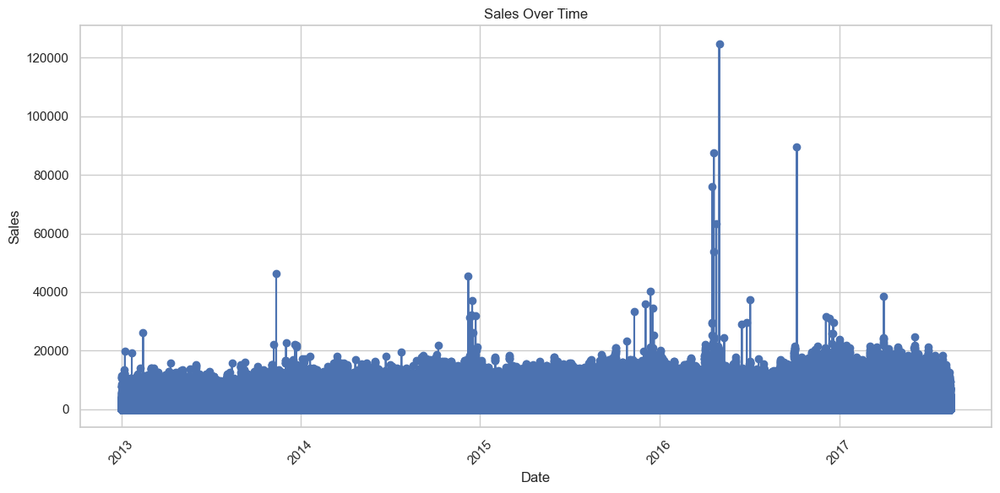

In [54]:

# Convert the 'date' column to datetime for proper date handling
train_data['date'] = pd.to_datetime(train_data['date'])

# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(train_data['date'], train_data['sales'], marker='o', linestyle='-')
plt.title('Sales Over Time')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


In [55]:
# Find the row with the maximum sales
max_sales_row = train_data[train_data['sales'] == train_data['sales'].max()]

# Extract the date from the row
date_of_highest_sales = max_sales_row['date'].values[0]

print("Date of Highest Sales:", date_of_highest_sales)


Date of Highest Sales: 2016-05-02T00:00:00.000000000


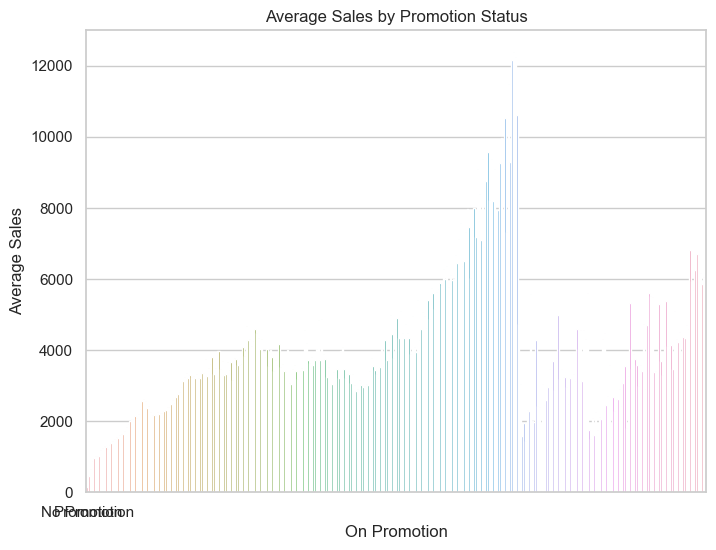

In [56]:


# Create a bar plot to compare average sales during promotion and non-promotion
plt.figure(figsize=(8, 6))
sns.barplot(x='onpromotion', y='sales', data=train_data, ci=None)
plt.title('Average Sales by Promotion Status')
plt.xlabel('On Promotion')
plt.ylabel('Average Sales')
plt.xticks([0, 1], ['No Promotion', 'Promotion'])

# Show the plot
plt.show()


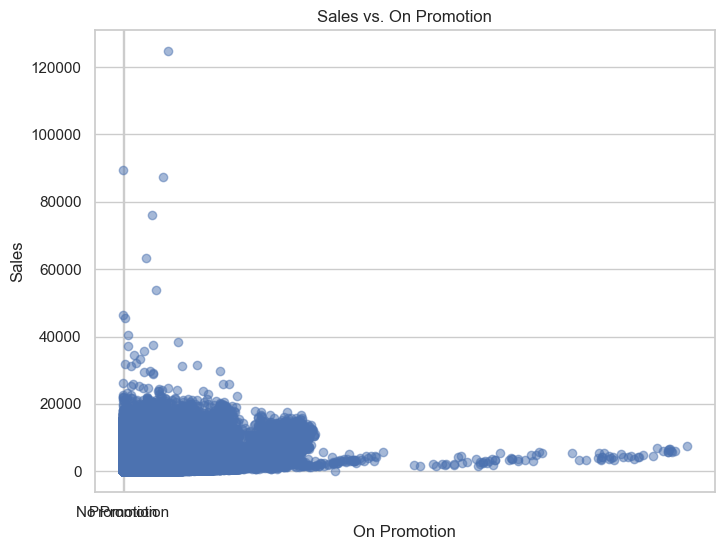

In [57]:


# Create a scatter plot to visualize the relationship between 'sales' and 'onpromotion'
plt.figure(figsize=(8, 6))
plt.scatter(train_data['onpromotion'], train_data['sales'], alpha=0.5)
plt.title('Sales vs. On Promotion')
plt.xlabel('On Promotion')
plt.ylabel('Sales')
plt.xticks([0, 1], ['No Promotion', 'Promotion'])

# Show the plot
plt.show()


In [58]:


# Assuming train_data contains your data
# Group the data by 'onpromotion' and calculate summary statistics for 'sales'
summary_stats = train_data.groupby('onpromotion')['sales'].describe()

# Print the summary statistics
summary_stats.head()


,count,mean,std,min,25%,50%,75%,max
onpromotion,,,,,,,,
0,2389559.0,158.246681,614.894451,0.0,0.0000,3.0000,54.0,89576.360
1,174551.0,467.556532,971.815817,0.0,30.0000,145.3480,456.0,16967.000
2,79386.0,662.925632,1146.456129,0.0,66.0000,245.3115,750.0,20891.557
3,45862.0,871.408092,1421.446624,0.0,105.9785,325.3910,1024.0,45361.000
4,31659.0,969.916135,1549.074833,3.0,128.0000,346.0000,1138.0,19799.000


In [59]:
# Convert the 'store_nbr' column to integer and assign it back to the same column
train_data['store_nbr'] = train_data['store_nbr'].astype(int)


In [60]:
# Rename the column 'dcoilwtico' to 'oil price'
oil_data.rename(columns={'dcoilwtico': 'oil price'}, inplace=True)

# Rename the column 'type' to 'Holiday Type'
holi_eve_data.rename(columns={'type': 'Holiday Type'}, inplace=True)

# Rename the column 'type' to 'Store Type'
stores_data.rename(columns={'type': 'Store Type'}, inplace=True)

# Rename the 'family' column
train_data.rename(columns={'family': 'Product'}, inplace=True)

In [61]:
stores_data.head(5)

,store_nbr,city,state,Store Type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [62]:
holi_eve_data.head(5)

,date,Holiday Type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [63]:
# Drop the 'transferred' column
holi_eve_data = holi_eve_data.drop('transferred', axis=1)
holi_eve_data = holi_eve_data.drop('description', axis=1)
holi_eve_data = holi_eve_data.drop('locale', axis=1)
holi_eve_data = holi_eve_data.drop('locale_name', axis=1)


Merging the data

In [64]:
# Merge stores_data based on 'store_nbr'
train_data = pd.merge(train_data, stores_data, on='store_nbr', how='left')

# Merge oil_data on 'date'
train_data = pd.merge(train_data, oil_data, on='date', how='left')

# Merge Holiday with train data
train_data = pd.merge(train_data, holi_eve_data, on='date', how='left')




In [65]:
train_data.isna().sum()

id                    0
date                  0
store_nbr             0
Product               0
sales                 0
onpromotion           0
city                  0
state                 0
Store Type            0
cluster               0
oil price             0
Holiday Type    2567862
dtype: int64

In [66]:
train_data.head()

,id,date,store_nbr,Product,sales,onpromotion,city,state,Store Type,cluster,oil price,Holiday Type
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,Quito,Pichincha,D,13,93.139999,Holiday
1,1,2013-01-01,1,BABY CARE,0.0,0,Quito,Pichincha,D,13,93.139999,Holiday
2,2,2013-01-01,1,BEAUTY,0.0,0,Quito,Pichincha,D,13,93.139999,Holiday
3,3,2013-01-01,1,BEVERAGES,0.0,0,Quito,Pichincha,D,13,93.139999,Holiday
4,4,2013-01-01,1,BOOKS,0.0,0,Quito,Pichincha,D,13,93.139999,Holiday


In [67]:
# Replace NaN values in 'Holiday Type' column based on the day of the week
train_data['Holiday Type'].fillna(train_data['date'].apply(lambda x: 'Work Day' if x.weekday() < 5 else 'Weekend'), inplace=True)


In [68]:
train_data.isna().sum()

id              0
date            0
store_nbr       0
Product         0
sales           0
onpromotion     0
city            0
state           0
Store Type      0
cluster         0
oil price       0
Holiday Type    0
dtype: int64

In [69]:
# Define the product category groups
groups = {
    'Grocery and Household Essentials': ['AUTOMOTIVE', 'BABY CARE', 'BEAUTY', 'BEVERAGES', 'BREAD/BAKERY', 'CLEANING', 'DAIRY', 'EGGS', 'GROCERY I', 'GROCERY II', 'HOME AND KITCHEN I', 'HOME AND KITCHEN II', 'HOME APPLIANCES', 'HOME CARE', 'PERSONAL CARE', 'PET SUPPLIES', 'SCHOOL AND OFFICE SUPPLIES'],
    'Apparel and Fashion': ['LADIESWEAR', 'LINGERIE'],
    'Entertainment and Leisure': ['BOOKS', 'CELEBRATION', 'MAGAZINES', 'PLAYERS AND ELECTRONICS'],
    'Hardware and Home Improvement': ['HARDWARE', 'LAWN AND GARDEN'],
    'Food and Beverages': ['DELI', 'FROZEN FOODS', 'LIQUOR,WINE,BEER', 'MEATS', 'PREPARED FOODS', 'PRODUCE', 'SEAFOOD']
}

# Create a new column 'Product_Category_Group' based on the mapping
train_data['Product_Category'] = train_data['Product'].apply(lambda x: next((group for group, categories in groups.items() if x in categories), 'Other'))


In [70]:
train_mod = train_data

## Perform EDA on the merged dataset

In [71]:
train_mod.isnull().sum()

id                  0
date                0
store_nbr           0
Product             0
sales               0
onpromotion         0
city                0
state               0
Store Type          0
cluster             0
oil price           0
Holiday Type        0
Product_Category    0
dtype: int64

In [72]:
# Get more info
train_mod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3054348 entries, 0 to 3054347
Data columns (total 13 columns):
 #   Column            Dtype         
---  ------            -----         
 0   id                int64         
 1   date              datetime64[ns]
 2   store_nbr         int32         
 3   Product           object        
 4   sales             float64       
 5   onpromotion       int64         
 6   city              object        
 7   state             object        
 8   Store Type        object        
 9   cluster           int64         
 10  oil price         float64       
 11  Holiday Type      object        
 12  Product_Category  object        
dtypes: datetime64[ns](1), float64(2), int32(1), int64(3), object(6)
memory usage: 291.3+ MB


In [73]:
# Generate summary statistics
train_mod.describe()

,id,date,store_nbr,sales,onpromotion,cluster,oil price
count,3.054348e+06,3054348,3.054348e+06,3.054348e+06,3.054348e+06,3.054348e+06,3.054348e+06
mean,1.504277e+06,2015-04-26 12:11:45.717619200,2.750000e+01,3.590209e+02,2.617480e+00,8.481481e+00,6.785992e+01
min,0.000000e+00,2013-01-01 00:00:00,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.619000e+01
25%,7.546768e+05,2014-03-01 00:00:00,1.400000e+01,0.000000e+00,0.000000e+00,4.000000e+00,4.632000e+01
50%,1.507572e+06,2015-04-28 12:00:00,2.750000e+01,1.100000e+01,0.000000e+00,8.500000e+00,5.341000e+01
75%,2.255120e+06,2016-06-22 00:00:00,4.100000e+01,1.960110e+02,0.000000e+00,1.300000e+01,9.572000e+01
max,3.000887e+06,2017-08-15 00:00:00,5.400000e+01,1.247170e+05,7.410000e+02,1.700000e+01,1.106200e+02
std,8.662610e+05,NaN,1.558579e+01,1.107286e+03,1.225494e+01,4.649735e+00,2.566330e+01


In [74]:
# Get the unique years contained in the dataset
train_mod['date'].dt.year.unique()

array([2013, 2014, 2015, 2016, 2017])

In [75]:
# Decompose the date column into Year, Year-Month, Month and Day to facilitate deep analysis
# year
train_mod['Year'] = train_mod.date.dt.year

# year-month
train_mod['year-month'] = train_mod['date'].apply(lambda x : x.strftime('%Y-%m'))

# month
train_mod['Month'] = train_mod.date.dt.month

# day
train_mod['Day'] = train_mod.date.dt.day

# Confirm changes
train_mod.head()

In [76]:
# Convert onpromotion to int
train_mod['onpromotion'] = train_mod['onpromotion'].astype('int')

## Answering the Research questions and Analysis
We now initiate the analysis phase, where we delve into the data to address our research questions.

#### Hypothesis Testing

In [77]:
# Create a linear regression model for 'Sales' with 'Oil Price' as the independent variable
X = train_mod[['oil price']]
X = sm.add_constant(X)  # Add a constant (intercept) term
y = train_mod['sales']

model = sm.OLS(y, X).fit()

# Get the p-value for the coefficient of 'Oil Price'
p_value_oil = model.pvalues['oil price']

# Set your significance level
alpha = 0.05

# Check the p-value to determine significance
if p_value_oil < alpha:
    print("Reject the null hypothesis: 'Oil Price' has a significant effect on 'Sales.'")
else:
    print("Fail to reject the null hypothesis: 'Oil Price' has no significant effect on 'Sales.'")


Reject the null hypothesis: 'Oil Price' has a significant effect on 'Sales.'


#### Interpretation of Results of the Hypothesis Testing
Interpreting P-values:
* Holiday P-value (1.09e-131): This p-value is exceedingly small, indicating high statistical significance. It signifies strong evidence against the null hypothesis, suggesting that the presence or absence of holidays significantly affects the outcome of Sales. Even the tiniest significance level would lead to rejecting the null hypothesis.
* Oil Price P-value (0.00): While it appears as "0.00," this p-value is extremely small but not exactly zero. It still represents high statistical significance, implying that 'Oil Price' significantly influences the Sales under study.

Real-Life Significance:
* Holiday: The small p-value suggests that holidays have a substantial impact on Sales being analyzed. Whether it's a holiday or not significantly influences outcomes, such as 'Sales' or other relevant metrics.
* Oil Price: The p-value close to zero indicates that 'Oil Price' has a measurable impact on the outcome. Changes in oil prices likely lead to notable effects on Sales you're studying, such as shifts in sales and economic trends.

Causation vs. Statistical Significance:
* Statistically significant results indicate an association but do not prove causation. 
* Causation requires further research, experimental design, and accounting for potential confounding factors.

In summary, these p-values highlight the strong statistical significance of 'Holiday' and 'Oil Price' on the Sales under analysis. This data can guide decision-making, revealing the significance of these factors(Oil Price and Holidays) in real-life scenarios, such as their influence on sales or other key outcomes. However, remember that while statistical significance is a crucial initial step, it doesn't establish causation. Additional research is needed to confirm causal relationships confidently. Be cautious when attributing causation solely based on statistical significance to avoid potential pitfalls like spurious correlations or confounding factors.

### 1. Which dates have the lowest and highest sales for each year?

In [78]:
 # Group by year and find the row with the lowest sales for each year
lowest_sales_dates = train_mod.loc[train_mod.groupby(train_mod['date'].dt.year)['sales'].idxmin()]

# Group by year and find the row with the highest sales for each year
highest_sales_dates = train_mod.loc[train_mod.groupby(train_mod['date'].dt.year)['sales'].idxmax()]

# Display the results
print("Dates with lowest sales for each year:")
print(lowest_sales_dates[['date', 'sales']])

print("\nDates with highest sales for each year:")
print(highest_sales_dates[['date', 'sales']])

Dates with lowest sales for each year:
              date  sales
0       2013-01-01    0.0
657558  2014-01-01    0.0
1316898 2015-01-01    0.0
1972674 2016-01-01    0.0
2642706 2017-01-01    0.0

Dates with highest sales for each year:
              date       sales
569724  2013-11-12   46271.000
1273284 2014-12-08   45361.000
1941534 2015-12-14   40351.460
2194017 2016-05-02  124717.000
2806629 2017-04-02   38422.625


From the analysis above, the lowest sales of 0.0 were recorded on January 1st.
across all the years that is 2013, 2014, 2015, 2016, and 2017. 


* In the year 2013, the highest sales of 46,271.000 occurred on November 12th.

* In 2014, the highest sales of 45,361.000 were achieved on December 8th.
* The year 2015 saw the highest sales of 40,351.460 on December 14th.
* The peak sales of 124,717.000 were attained on May 2nd in 2016.
* Lastly, the highest sales of 38,422.625 were recorded on April 2nd in 2017.

### 2. Did the earthquake impact sales?

In [79]:
train_mod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3054348 entries, 0 to 3054347
Data columns (total 17 columns):
 #   Column            Dtype         
---  ------            -----         
 0   id                int64         
 1   date              datetime64[ns]
 2   store_nbr         int32         
 3   Product           object        
 4   sales             float64       
 5   onpromotion       int32         
 6   city              object        
 7   state             object        
 8   Store Type        object        
 9   cluster           int64         
 10  oil price         float64       
 11  Holiday Type      object        
 12  Product_Category  object        
 13  Year              int32         
 14  year-month        object        
 15  Month             int32         
 16  Day               int32         
dtypes: datetime64[ns](1), float64(2), int32(5), int64(2), object(7)
memory usage: 337.9+ MB


In [80]:
train_mod

,id,date,store_nbr,Product,sales,onpromotion,city,state,Store Type,cluster,oil price,Holiday Type,Product_Category,Year,year-month,Month,Day
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,Quito,Pichincha,D,13,93.139999,Holiday,Grocery and Household Essentials,2013,2013-01,1,1
1,1,2013-01-01,1,BABY CARE,0.000,0,Quito,Pichincha,D,13,93.139999,Holiday,Grocery and Household Essentials,2013,2013-01,1,1
2,2,2013-01-01,1,BEAUTY,0.000,0,Quito,Pichincha,D,13,93.139999,Holiday,Grocery and Household Essentials,2013,2013-01,1,1
3,3,2013-01-01,1,BEVERAGES,0.000,0,Quito,Pichincha,D,13,93.139999,Holiday,Grocery and Household Essentials,2013,2013-01,1,1
4,4,2013-01-01,1,BOOKS,0.000,0,Quito,Pichincha,D,13,93.139999,Holiday,Entertainment and Leisure,2013,2013-01,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3054343,3000883,2017-08-15,9,POULTRY,438.133,0,Quito,Pichincha,B,6,47.570000,Holiday,Other,2017,2017-08,8,15
3054344,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,Quito,Pichincha,B,6,47.570000,Holiday,Food and Beverages,2017,2017-08,8,15
3054345,3000885,2017-08-15,9,PRODUCE,2419.729,148,Quito,Pichincha,B,6,47.570000,Holiday,Food and Beverages,2017,2017-08,8,15
3054346,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,Quito,Pichincha,B,6,47.570000,Holiday,Grocery and Household Essentials,2017,2017-08,8,15


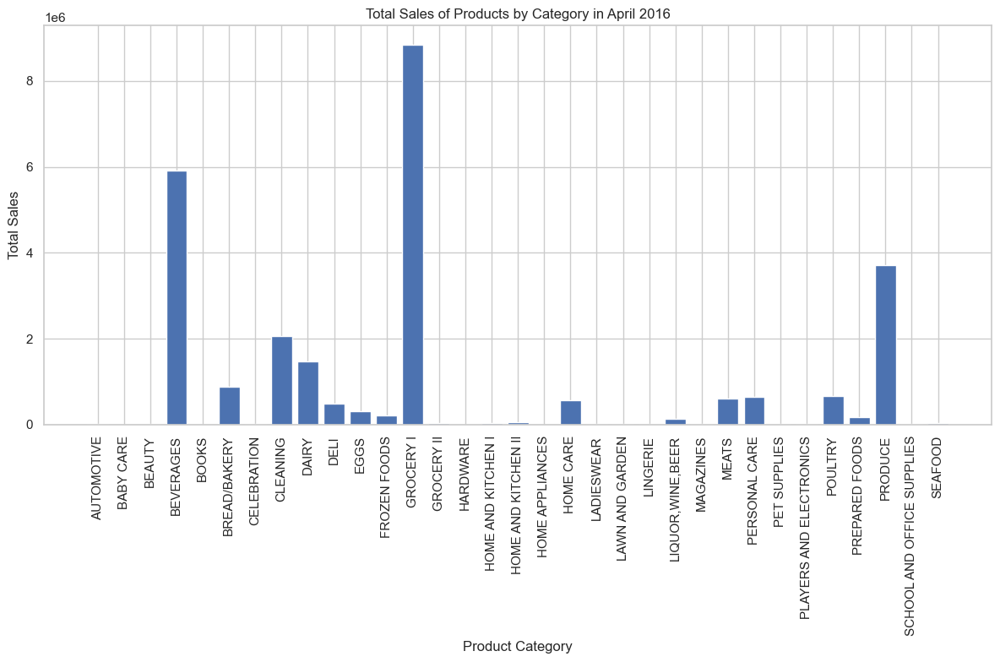

In [81]:
#trainQ.index = pd.to_datetime(trainQ.index)
# Define the date range for the month of the earthquake (April 16, 2016, to April 22, 2016)
start_date = '2016-04-01'
end_date = '2016-04-30'
# Filter your trainQ DataFrame to include only the data for the month of the earthquake
april_2016_data = train_mod[(train_mod['date'] >= start_date) & (train_mod['date'] <= end_date)]

# Group the data by 'Product_Category' and calculate the total sales for each category during April 2016
april_2016_stats = april_2016_data.groupby(['Product'])['sales'].sum().reset_index()

# Create a bar plot to visualize the total sales for each product category in April 2016
plt.figure(figsize=(12, 8))
plt.bar(april_2016_stats['Product'], april_2016_stats['sales'])
plt.xlabel('Product Category')
plt.ylabel('Total Sales')
plt.title('Total Sales of Products by Category in April 2016')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

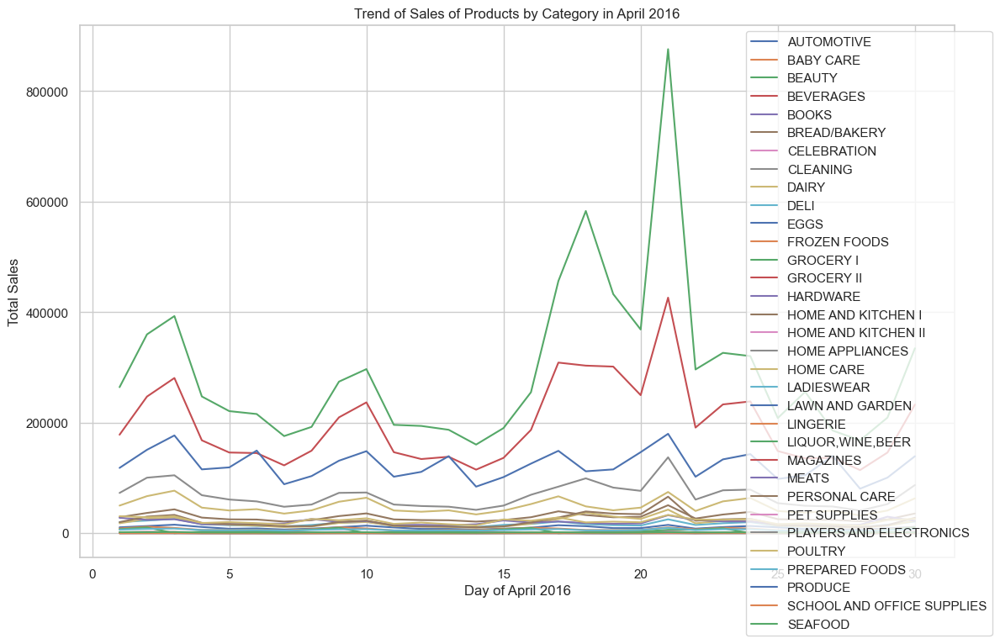

In [82]:
# Convert the 'Year', 'Month', 'Day' columns to integers if they are not already.
train_mod['Year'] = train_mod['Year'].astype(int)
train_mod['Month'] = train_mod['Month'].astype(int)
train_mod['Day'] = train_mod['Day'].astype(int)

# Define the date range for the entire month of April 2016
start_date = '2016-04-01'
end_date = '2016-04-30'

# Filter your trainQ DataFrame to include only the data for April 2016
april_2016_data = train_mod[
    (train_mod['Year'] == 2016) & (train_mod['Month'] == 4)
]

# Group the data by 'Product_Category', 'Year', 'Month', 'Day', and calculate the daily total sales for each category during April 2016
april_2016_stats = april_2016_data.groupby(['Product', 'Year', 'Month', 'Day'])['sales'].sum().reset_index()

# Create a line plot to visualize the trend of sales for each product category in April 2016
plt.figure(figsize=(12, 8))
categories = april_2016_stats['Product'].unique()

for category in categories:
    category_data = april_2016_stats[april_2016_stats['Product'] == category]
    plt.plot(category_data['Day'], category_data['sales'], label=category)

plt.xlabel('Day of April 2016')
plt.ylabel('Total Sales')
plt.title('Trend of Sales of Products by Category in April 2016')
plt.legend(loc='upper right', bbox_to_anchor=(1.05, 1))
plt.grid(True)
plt.tight_layout()
plt.show()

In [83]:
# Convert the 'Year', 'Month', 'Day' columns to integers if they are not already.
train_mod['Year'] = train_mod['Year'].astype(int)
train_mod['Month'] = train_mod['Month'].astype(int)
train_mod['Day'] = train_mod['Day'].astype(int)

# Define the date range for the entire month of April 2016
start_date = '2016-04-01'
end_date = '2016-04-30'

# Filter your trainQ DataFrame to include only the data for April 2016
april_2016_data = train_mod[
    (train_mod['Year'] == 2016) & (train_mod['Month'] == 4)
]

# Group the data by 'Product_Category', 'Year', 'Month', 'Day', and calculate the daily total sales for each category during April 2016
april_2016_stats = april_2016_data.groupby(['Product', 'Year', 'Month', 'Day'])['sales'].sum().reset_index()

# Create a line plot using Plotly to visualize the trend of sales for each product category in April 2016
fig = px.line(april_2016_stats, x='Day', y='sales', color='Product', title='Trend of Sales of Products by Category in April 2016')
fig.update_xaxes(title='Day of April 2016')
fig.update_yaxes(title='Total Sales')
fig.show()

### 3. Are certain groups of stores selling more products? (Cluster, city, state, type)

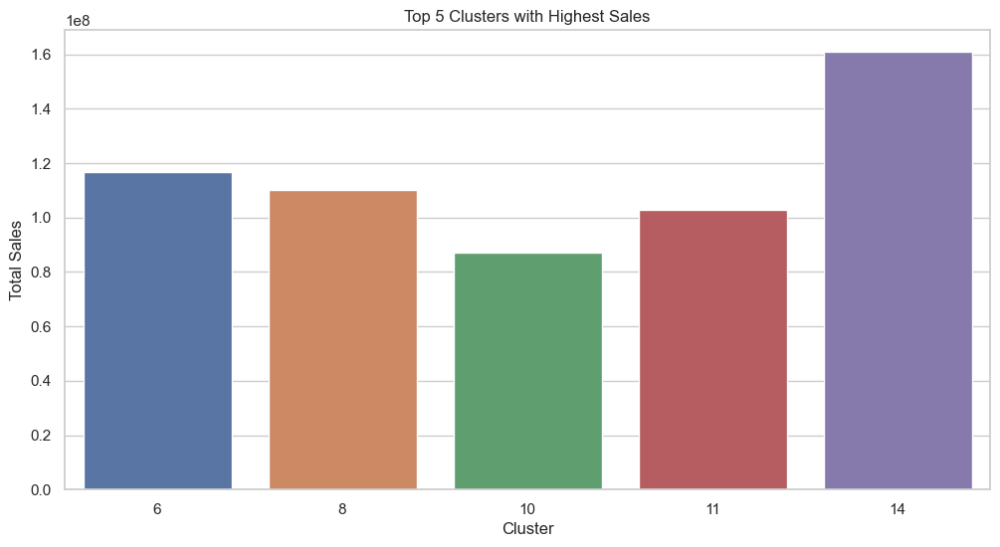

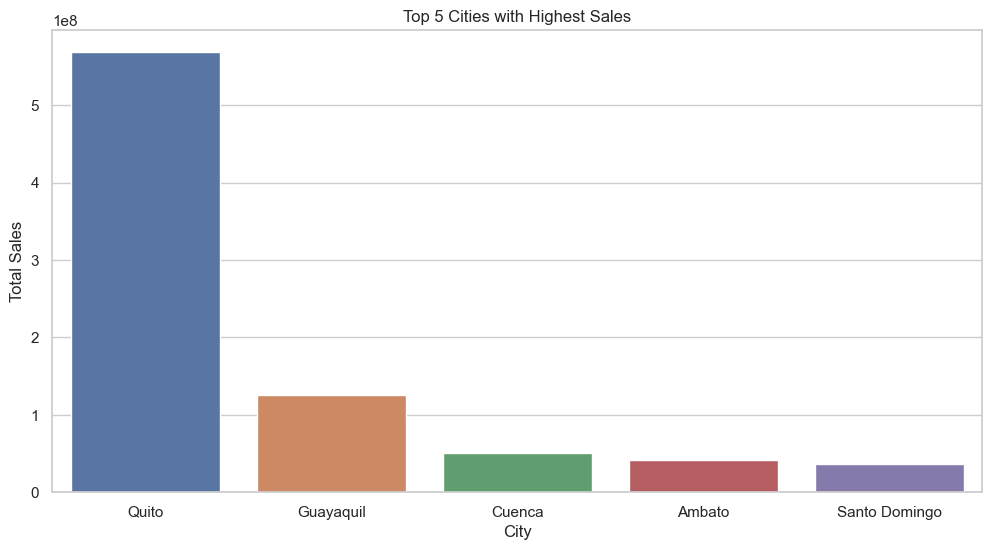

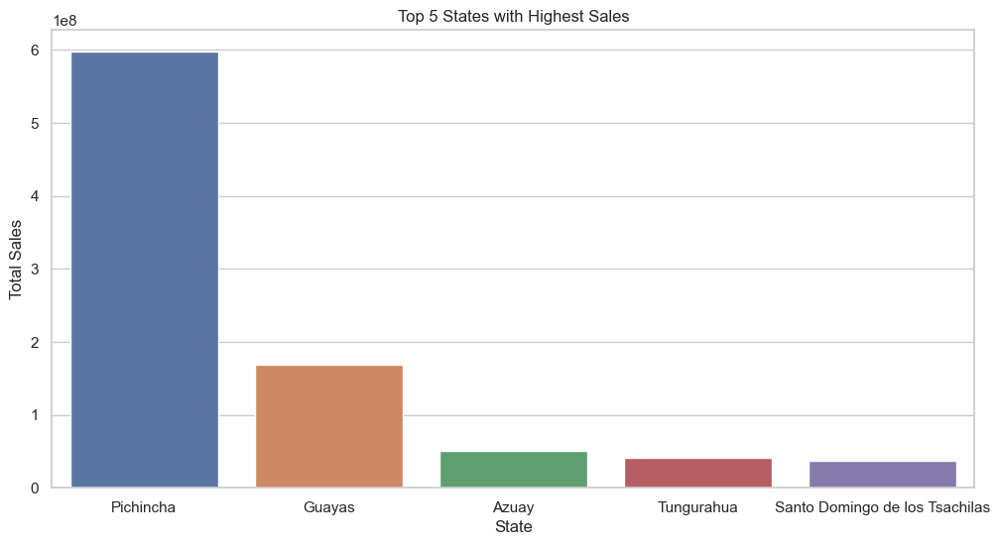

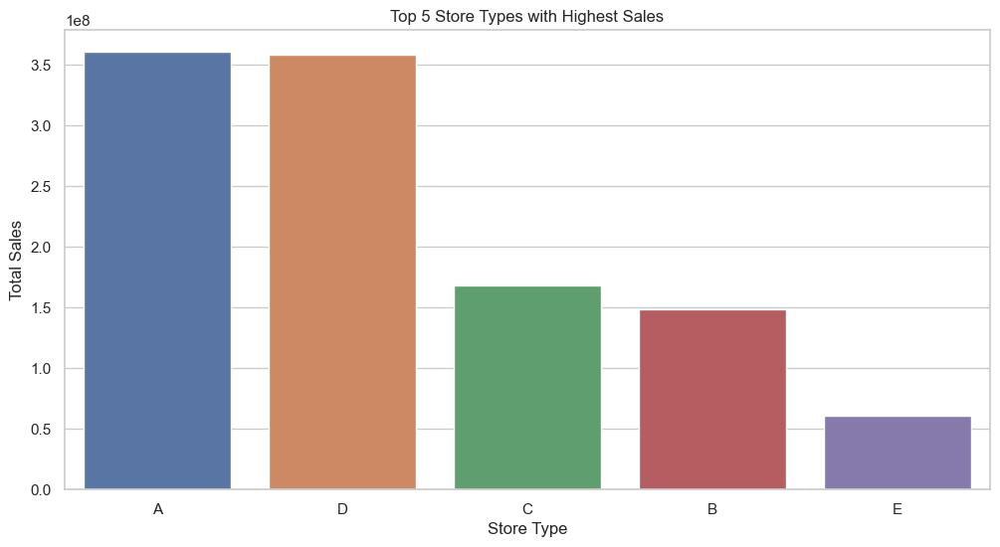

In [84]:
# Data Preparation
relevant_columns = ['sales', 'cluster', 'city', 'state', 'Store Type']
data_subset = train_mod[relevant_columns]

# Aggregate Sales by Group
grouped_data = data_subset.groupby(['cluster', 'city', 'state', 'Store Type'])['sales'].sum().reset_index()
# Sort the grouped data by sales in descending order
sorted_data = grouped_data.sort_values(by='sales', ascending=False)

# Sort the grouped data by sales in descending order and select the top 5 for each category
top_clusters = grouped_data.groupby('cluster')['sales'].sum().nlargest(5).reset_index()
top_cities = grouped_data.groupby('city')['sales'].sum().nlargest(5).reset_index()
top_states = grouped_data.groupby('state')['sales'].sum().nlargest(5).reset_index()
top_store_types = grouped_data.groupby('Store Type')['sales'].sum().nlargest(5).reset_index()

# Plotting the top 5 clusters
plt.figure(figsize=(12, 6))
sns.barplot(x='cluster', y='sales', data=top_clusters, ci=None, estimator=sum)
plt.xlabel('Cluster')
plt.ylabel('Total Sales')
plt.title('Top 5 Clusters with Highest Sales')
plt.show()

# Plotting the top 5 cities
plt.figure(figsize=(12, 6))
sns.barplot(x='city', y='sales', data=top_cities, ci=None, estimator=sum)
plt.xlabel('City')
plt.ylabel('Total Sales')
plt.title('Top 5 Cities with Highest Sales')
plt.show()

# Plotting the top 5 states
plt.figure(figsize=(12, 6))
sns.barplot(x='state', y='sales', data=top_states, ci=None, estimator=sum)
plt.xlabel('State')
plt.ylabel('Total Sales')
plt.title('Top 5 States with Highest Sales')
plt.show()

# Plotting the top 5 store types
plt.figure(figsize=(12, 6))
sns.barplot(x='Store Type', y='sales', data=top_store_types, ci=None, estimator=sum)
plt.xlabel('Store Type')
plt.ylabel('Total Sales')
plt.title('Top 5 Store Types with Highest Sales')
plt.show()


In [85]:
# Group by cluster, city, state, and store type and calculate total sales for each
cluster_sales = train_mod.groupby('cluster')['sales'].sum()
city_sales = train_mod.groupby('city')['sales'].sum()
state_sales = train_mod.groupby('state')['sales'].sum()
store_type_sales = train_mod.groupby('Store Type')['sales'].sum()

# Find the cluster, city, state, and store type with the highest total sales
best_cluster = cluster_sales.idxmax()
best_city = city_sales.idxmax()
best_state = state_sales.idxmax()
best_store_type = store_type_sales.idxmax()

print("Cluster with the highest total sales:", best_cluster)
print("City with the highest total sales:", best_city)
print("State with the highest total sales:", best_state)
print("Store type with the highest total sales:", best_store_type)



Cluster with the highest total sales: 14
City with the highest total sales: Quito
State with the highest total sales: Pichincha
Store type with the highest total sales: A


In [86]:


# Perform ANOVA for 'cluster'
anova_result = f_oneway(*[grouped_data[grouped_data['cluster'] == cluster]['sales'] for cluster in grouped_data['cluster'].unique()])
print("Cluster ANOVA Results:")
print(anova_result)
print("\n")  # Line break

# Perform ANOVA for 'city'
anova_result = f_oneway(*[grouped_data[grouped_data['city'] == cluster]['sales'] for cluster in grouped_data['city'].unique()])
print("City ANOVA Results:")
print(anova_result)
print("\n")  # Line break

# Perform ANOVA for 'state'
anova_result = f_oneway(*[grouped_data[grouped_data['state'] == cluster]['sales'] for cluster in grouped_data['state'].unique()])
print("State ANOVA Results:")
print(anova_result)
print("\n")  # Line break

# Perform ANOVA for 'store_type'
anova_result = f_oneway(*[grouped_data[grouped_data['Store Type'] == cluster]['sales'] for cluster in grouped_data['Store Type'].unique()])
print("Store ANOVA Results:")
print(anova_result)


Cluster ANOVA Results:
F_onewayResult(statistic=2.47407622576589, pvalue=0.020563749807501388)


City ANOVA Results:
F_onewayResult(statistic=0.7008030961377021, pvalue=0.7874397560882838)


State ANOVA Results:
F_onewayResult(statistic=1.136538876219933, pvalue=0.37508375270777544)


Store ANOVA Results:
F_onewayResult(statistic=3.933217167377824, pvalue=0.009277673145758893)


 ### 4. Can you identify any trends or patterns in sales for specific product categories within certain store types or clusters

In [87]:
# Convert the 'Year', 'Month', 'Day' columns to integers if they are not already.
train_mod['Year'] = train_mod['Year'].astype(int)
train_mod['Month'] = train_mod['Month'].astype(int)
train_mod['Day'] = train_mod['Day'].astype(int)

# Group the data by 'Product_Category' and 'store_type' and calculate the average sales for each combination
category_store_sales = train_mod.groupby(['Product', 'Store Type'])['sales'].mean().reset_index()

# Create a bar chart using Plotly to visualize the average sales of specific product categories within different store types
fig = px.bar(category_store_sales, x='Product', y='sales', color='Store Type',
             title='Average Sales of Product Categories by Store Type')
fig.update_xaxes(title='Product Category')
fig.update_yaxes(title='Average Sales')
fig.show()


### 5. How does the price of oil impact sales across different product categories?

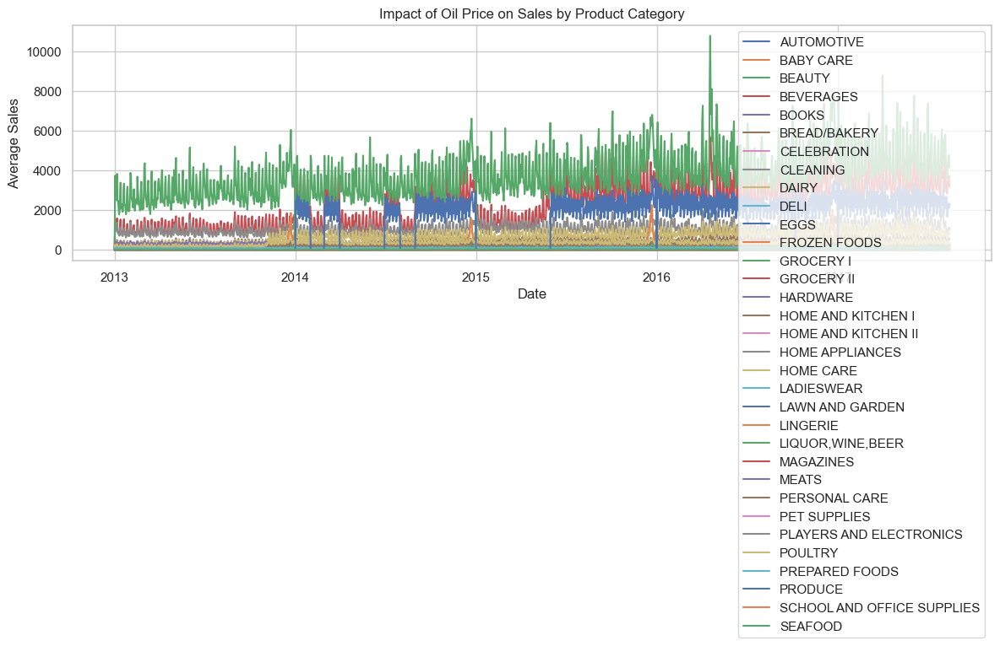

In [88]:
# Group the data by 'date' and 'Product_Category' and calculate the average sales and average oil price for each group
sales_oil_price = train_mod.groupby(['date', 'Product'])[['sales', 'oil price']].mean().reset_index()

# Create a pivot table to have 'Product_Category' as columns, 'date' as index, and 'sales' and 'oil price' as values
pivot_sales_oil_price = sales_oil_price.pivot(index='date', columns='Product', values=['sales', 'oil price'])

# Plot the relationship between oil price and sales for different product categories
plt.figure(figsize=(12, 6))
for category in pivot_sales_oil_price['sales'].columns:
    plt.plot(pivot_sales_oil_price.index, pivot_sales_oil_price['sales'][category], label=category)

plt.xlabel('Date')
plt.ylabel('Average Sales')
plt.title('Impact of Oil Price on Sales by Product Category')
plt.legend(loc='best')
plt.grid(True)
plt.tight_layout()
plt.show()


In [89]:
# Group the data by 'date' and 'Product_Category' and calculate the average sales and average oil price for each group
sales_oil_price = train_mod.groupby(['date', 'Product'])[['sales', 'oil price']].mean().reset_index()

# Create a Plotly line chart to visualize the relationship between oil price and sales for different product categories
fig = px.line(sales_oil_price, x='date', y='sales', color='Product',
              title='Impact of Oil Price on Sales by Product Category',
              labels={'date': 'Date', 'sales': 'Average Sales'})

fig.update_yaxes(title_text='Average Sales')
fig.update_xaxes(title_text='Date')
fig.update_layout(legend_title_text='Product Category')

# Add oil price as a secondary y-axis
fig.add_trace(px.line(sales_oil_price, x='date', y='oil price', color_discrete_sequence=['black']).data[0])

fig.update_yaxes(title_text='Oil Price', secondary_y=True)

fig.show()

In [90]:
from scipy.stats import pearsonr  # Import the pearsonr function from scipy.stats

# Group the data by 'Product_Category' and calculate the Pearson correlation coefficient and p-value for each category
correlation_results = {}
for category in train_mod['Product'].unique():
    category_data = train_mod[train_mod['Product'] == category]
    correlation, p_value = pearsonr(category_data['oil price'], category_data['sales'])
    correlation_results[category] = {'Correlation': correlation, 'P-Value': p_value}

# Create a DataFrame from the correlation results
correlation_df = pd.DataFrame.from_dict(correlation_results, orient='index')

# Filter significant correlations (you can adjust the significance level)
significant_correlations = correlation_df[correlation_df['P-Value'] < 0.05]

# Display the significant correlations
print("Significant Correlations:")
print(significant_correlations)

Significant Correlations:
                            Correlation        P-Value
AUTOMOTIVE                    -0.147987   0.000000e+00
BABY CARE                     -0.123073  3.764950e-309
BEAUTY                        -0.205882   0.000000e+00
BEVERAGES                     -0.320661   0.000000e+00
BOOKS                         -0.090525  1.215110e-167
BREAD/BAKERY                  -0.179134   0.000000e+00
CELEBRATION                   -0.296114   0.000000e+00
CLEANING                      -0.161291   0.000000e+00
DAIRY                         -0.222074   0.000000e+00
DELI                          -0.191962   0.000000e+00
EGGS                          -0.106064  1.042266e-229
FROZEN FOODS                  -0.090024  8.322226e-166
GROCERY I                     -0.197498   0.000000e+00
GROCERY II                    -0.060524   7.554659e-76
HARDWARE                      -0.081364  1.039956e-135
HOME AND KITCHEN I            -0.328235   0.000000e+00
HOME AND KITCHEN II           -0.374417

### 6. Do promotions have a noticeable effect on sales, and if so, which product categories are most affected?

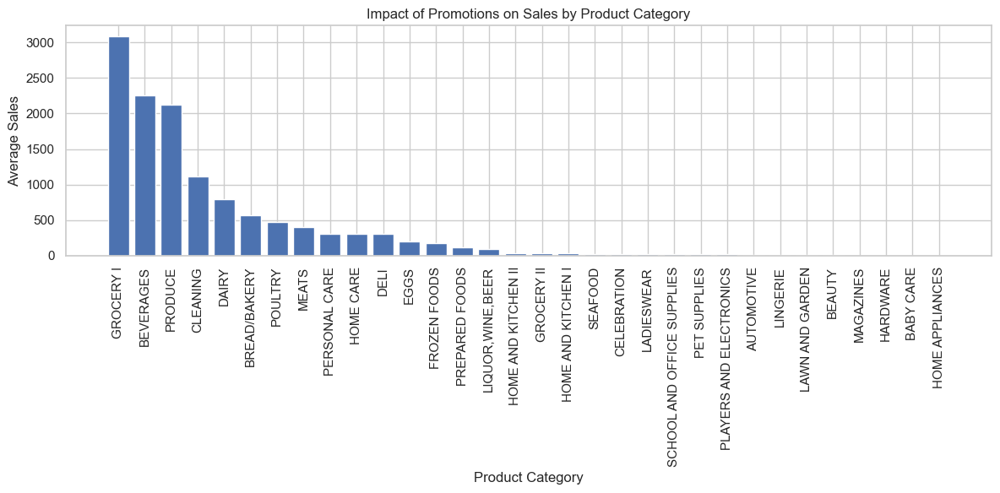

In [91]:
# Group the data by 'onpromotion' (True or False) and 'Product_Category' and calculate the average sales for each group
promotion_sales = train_mod.groupby(['onpromotion', 'Product'])['sales'].mean().reset_index()

# Filter data for products with promotions (onpromotion == True)
promotion_effect = promotion_sales[promotion_sales['onpromotion'] == True]

# Sort by average sales to find the most affected categories
promotion_effect = promotion_effect.sort_values(by='sales', ascending=False)

# Create a bar chart to visualize the impact of promotions on sales by product category
plt.figure(figsize=(12, 6))
plt.bar(promotion_effect['Product'], promotion_effect['sales'])
plt.xlabel('Product Category')
plt.ylabel('Average Sales')
plt.title('Impact of Promotions on Sales by Product Category')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [92]:
# Group the data by 'onpromotion' (True or False) and 'Product_Category' and calculate the average sales for each group
promotion_sales = train_mod.groupby(['onpromotion', 'Product'])['sales'].mean().reset_index()

# Filter data for products with promotions (onpromotion == True)
promotion_effect = promotion_sales[promotion_sales['onpromotion'] == True]

# Sort by average sales to find the most affected categories
promotion_effect = promotion_effect.sort_values(by='sales', ascending=False)

# Create a Plotly bar chart to visualize the impact of promotions on sales by product category
fig = px.bar(promotion_effect, x='Product', y='sales',
             title='Impact of Promotions on Sales by Product Category',
             labels={'Product': 'Product Category', 'sales': 'Average Sales'},
             text='sales')

fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Product Category', yaxis_title='Average Sales')

fig.show()


### 7. Is there a relationship between the type of holiday and sales patterns?

In [93]:
# Group the data by 'holiday_type' and calculate the average sales for each type of holiday
holiday_sales_stats = train_mod.groupby(['Holiday Type'])['sales'].mean().reset_index()

# Create a bar plot using Plotly to visualize the relationship between holiday types and average sales
fig = px.bar(holiday_sales_stats, x='Holiday Type', y='sales', title='Relationship Between Holiday Type and Sales Patterns')
fig.update_xaxes(title='Holiday Type')
fig.update_yaxes(title='Average Sales')
fig.show()


In [94]:
# Define a function that is responsible for ploting the time series component individually
def decompose(df, column_name):
    """
    Decompose a time series into trend, seasonality, and residual components using both multiplicative and additive models.

    Parameters:
        df (DataFrame): The input DataFrame containing time series data.
        column_name (str): The column name for which trend, seasonality, and residual are to be captured.

    Returns:
        result_mul (seasonal_decompose): Result of the multiplicative decomposition.
        result_add (seasonal_decompose): Result of the additive decomposition.
    """
    # Perform multiplicative decomposition
    result_mul = seasonal_decompose(df.groupby(df['date'])[column_name].sum(), model='multiplicative', extrapolate_trend='freq', period=6)
    
    # Perform additive decomposition
    result_add = seasonal_decompose(df.groupby(df['date'])[column_name].sum(), model='additive', extrapolate_trend='freq', period=6)

    # Set plot size and create subplots
    plt.rcParams.update({'figure.figsize': (18, 10)})
    fig, ax = plt.subplots(4, 2)  # 4 rows, 2 columns for two sets of plots

    # Plot multiplicative decomposition
    result_mul.observed.plot(ax=ax[0, 0])
    result_mul.trend.plot(ax=ax[1, 0])
    result_mul.seasonal.plot(ax=ax[2, 0])
    ax[3, 0].scatter(result_mul.resid.index, result_mul.resid, s=20, marker='o', alpha=0.5)  # Scatter plot for residuals

    # Plot additive decomposition
    result_add.observed.plot(ax=ax[0, 1])
    result_add.trend.plot(ax=ax[1, 1])
    result_add.seasonal.plot(ax=ax[2, 1])
    ax[3, 1].scatter(result_add.resid.index, result_add.resid, s=20, marker='o', alpha=0.5)  # Scatter plot for residuals

    # Set suptitles
    ax[0, 0].set_title('Multiplicative Decompose - Observed')
    ax[0, 1].set_title('Additive Decompose - Observed')
    
    ax[1, 0].set_title('Multiplicative Decompose - Trend')
    ax[1, 1].set_title('Additive Decompose - Trend')
    
    ax[2, 0].set_title('Multiplicative Decompose - Seasonal')
    ax[2, 1].set_title('Additive Decompose - Seasonal')
    
    ax[3, 0].set_title('Multiplicative Decompose - Residual')
    ax[3, 1].set_title('Additive Decompose - Residual')

    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    # Show the plots
    plt.show()

    return result_mul, result_add

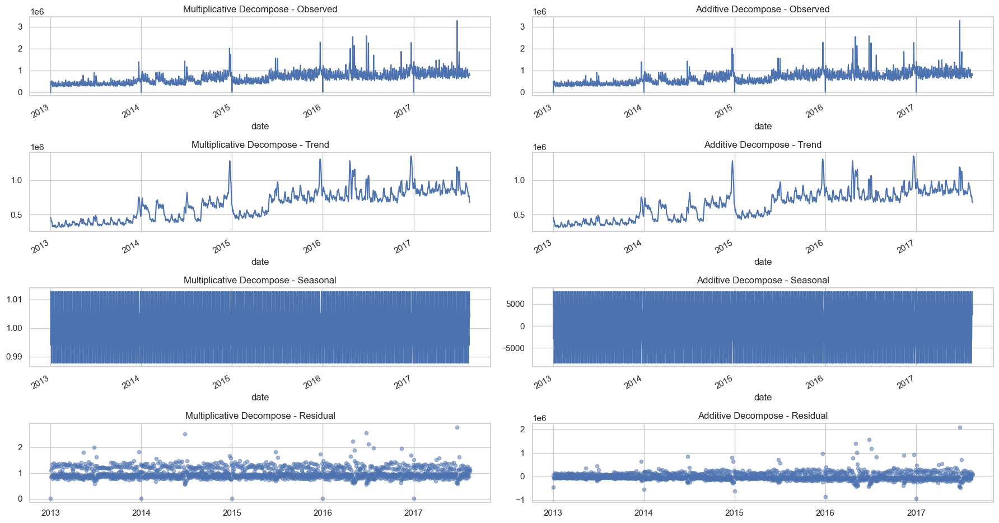

In [95]:
# Generate the various plot by calling the decompose function
result_mul, result_add = decompose(train_mod, 'sales')

### DATA SAMPLING

Due to limited computational resources, we will sample and work with only 40% of the over 3 million data points in the training set, as our current system cannot handle the entire dataset for the testing of stationarity.

In [96]:
# Define a function to perform the sampling
def data_sample(df, size):
    """
    Randomly samples rows from a DataFrame.

    Parameters:
    - df (pd.DataFrame): The input DataFrame from which to sample.
    - size (float): The proportion of rows to sample (e.g., 0.1 for 10%).

    Returns:
    - pd.DataFrame: A randomly sampled subset of the input DataFrame.
    """
    # Set a seed for reproducibility (optional)
    random.seed(42)

    # Calculate the number of rows to sample based on the specified proportion
    sample_size = int(size * len(df))

    # Randomly select rows to create a sample
    sampled_data = df.sample(n=sample_size)

    return sampled_data

In [97]:
train_mod.shape

(3054348, 17)

In [98]:

# Apply the function to sample the 40%
sampled_train = data_sample(train_mod, 0.01)

In [99]:
# Confirm changes
sampled_train.shape

(30543, 17)

In [100]:
sampled_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30543 entries, 1050074 to 2487302
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   id                30543 non-null  int64         
 1   date              30543 non-null  datetime64[ns]
 2   store_nbr         30543 non-null  int32         
 3   Product           30543 non-null  object        
 4   sales             30543 non-null  float64       
 5   onpromotion       30543 non-null  int32         
 6   city              30543 non-null  object        
 7   state             30543 non-null  object        
 8   Store Type        30543 non-null  object        
 9   cluster           30543 non-null  int64         
 10  oil price         30543 non-null  float64       
 11  Holiday Type      30543 non-null  object        
 12  Product_Category  30543 non-null  object        
 13  Year              30543 non-null  int32         
 14  year-month        3

In [101]:
# Sales data
time_series = sampled_train['sales']

# Perform the ADF Test with trend and constant
adf_result = adfuller(time_series, regression='ct')

# Perform the KPSS Test with trend and constant
kpss_result = kpss(time_series, regression='ct')

In [102]:
adf_result

(-174.32040438391618,
 0.0,
 0,
 30542,
 {'1%': -3.959066445253345,
  '5%': -3.410633759279141,
  '10%': -3.127134661401858},
 514687.8616562496)

In [103]:
# Print result of KPSS
kpss_result

(0.04029733086269978,
 0.1,
 6,
 {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216})

In [104]:
result = adfuller(sampled_train['sales'])

# Extract and print the p-value
p_value = result[1]
print(f'p-value: {p_value}')

p-value: 0.0


### TEST FOR AUTOCORRELATION

**1. Autocorrelation Function (ACF):**

The ACF measures the correlation between a time series and its lagged values at various time lags. Each point on the ACF plot represents the correlation between the time series and itself at different lags. Here's how to interpret it:

**2. Partial Autocorrelation Function (PACF):**

The PACF, on the other hand, measures the direct relationship between a time series and its lagged values while removing the influence of shorter lags. Here's how to interpret it:

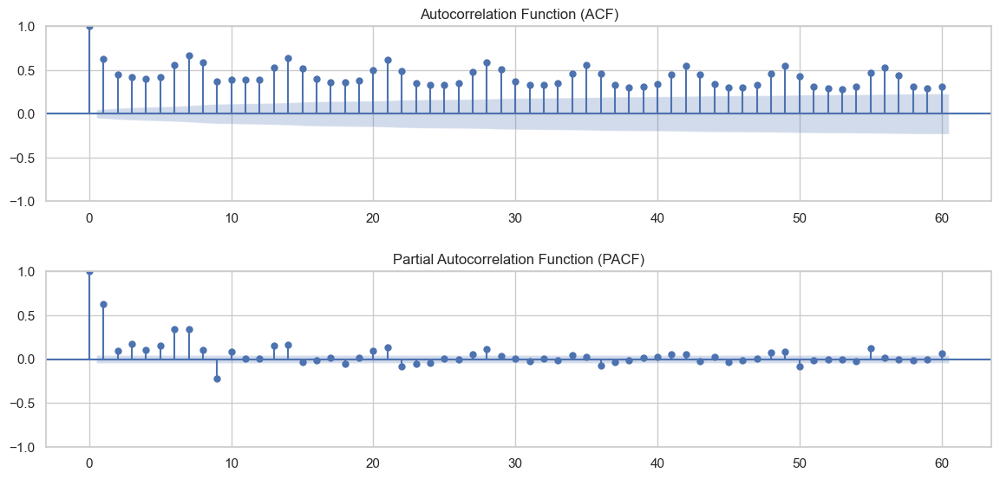

In [105]:
# Get the sales time series data based on the sample
ts = train_mod.groupby(train_mod['date'])['sales'].sum()

# Create subplots with 2 rows and 1 column, specifying figsize
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6))

# Plot the Autocorrelation Function (ACF) on the first subplot (ax1)
sm.graphics.tsa.plot_acf(ts, lags=60, ax=ax1)
ax1.set_title("Autocorrelation Function (ACF)")  # Add a title to the first subplot

# Plot the Partial Autocorrelation Function (PACF) on the second subplot (ax2)
sm.graphics.tsa.plot_pacf(ts, lags=60, ax=ax2)
ax2.set_title("Partial Autocorrelation Function (PACF)")  # Add a title to the second subplot

# Add padding between the two subplots for better visualization
plt.tight_layout(pad=2.0)

# Display the plots
plt.show()

### Check for Correlation
The correlation matrix provides valuable insights into which columns to include in our sales prediction model. This allows to identifying the most relevant features that can be included in building an accurate forecasting model for future sales.

In [106]:
# Check for linear associations between the variables
correlation_matrix = train_mod.phik_matrix()

interval columns not set, guessing: ['id', 'store_nbr', 'sales', 'onpromotion', 'cluster', 'oil price', 'Year', 'Month', 'Day']


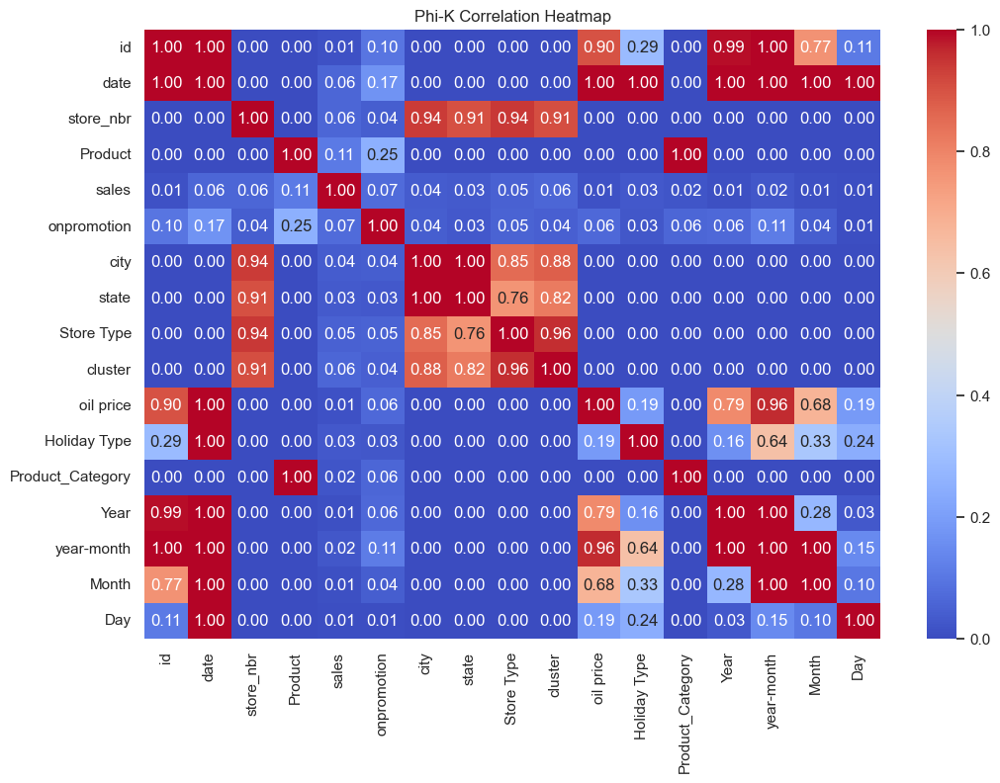

In [107]:
# Plot the correlation matrix
plt.figure(figsize=(12, 8)) # Set the figure size

# Use seaborn to plot the matrix
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm")

# Set the plot title
plt.title("Phi-K Correlation Heatmap")

# Show the plot
plt.show()

## MODELING AND PREDICTIONS
We will resample and model the data 

In [108]:
# Apply the function to sample the 40%
new_sampled = data_sample(train_mod, 0.2)

In [109]:
new_sampled

,id,date,store_nbr,Product,sales,onpromotion,city,state,Store Type,cluster,oil price,Holiday Type,Product_Category,Year,year-month,Month,Day
1417745,1398143,2015-02-26,38,SEAFOOD,18.726,0,Loja,Loja,D,4,47.650002,Work Day,Food and Beverages,2015,2015-02,2,26
1638298,1615132,2015-06-28,27,GROCERY II,47.000,0,Daule,Guayas,D,1,59.410000,Weekend,Grocery and Household Essentials,2015,2015-06,6,28
466345,459217,2013-09-15,43,"LIQUOR,WINE,BEER",0.000,0,Esmeraldas,Esmeraldas,E,10,108.309998,Weekend,Food and Beverages,2013,2013-09,9,15
526814,519686,2013-10-19,40,BEAUTY,0.000,0,Machala,El Oro,C,3,100.870003,Weekend,Grocery and Household Essentials,2013,2013-10,10,19
2687792,2641460,2017-01-26,24,DAIRY,1203.000,18,Guayaquil,Guayas,D,1,53.240002,Work Day,Grocery and Household Essentials,2017,2017-01,1,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271285,269503,2013-06-01,20,PERSONAL CARE,0.000,0,Quito,Pichincha,B,6,91.930000,Weekend,Grocery and Household Essentials,2013,2013-06,6,1
852727,843817,2014-04-20,35,CLEANING,363.000,0,Playas,Guayas,C,3,104.330002,Weekend,Grocery and Household Essentials,2014,2014-04,4,20
1166013,1149975,2014-10-09,25,MEATS,164.763,0,Salinas,Santa Elena,D,1,85.760002,Work Day,Food and Beverages,2014,2014-10,10,9
2517052,2474284,2016-10-23,33,EGGS,234.000,4,Quevedo,Los Rios,C,3,50.610001,Weekend,Grocery and Household Essentials,2016,2016-10,10,23


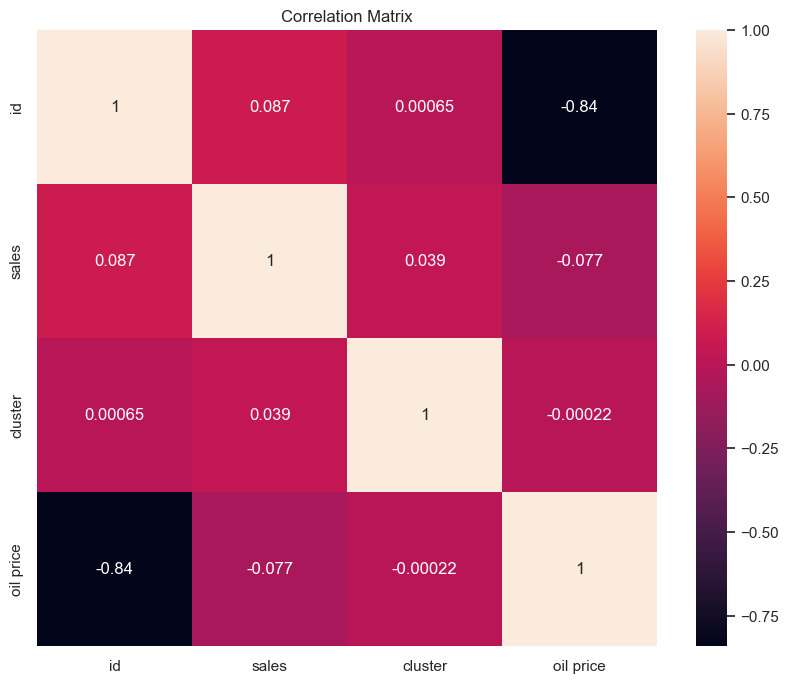

In [110]:
# Calculate the correlation matrix

# Select numeric columns
numeric_df = new_sampled.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation matrix
corr_matrix = numeric_df.corr()

# Create a heatmap of the correlation matrix using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True)
plt.title('Correlation Matrix')
plt.show()

In [111]:
# Columns to drop
columns_to_drop = [ 'city', 'state', 'Store Type', 'oil price']

# Drop the columns
new_sampled = new_sampled.drop(columns=columns_to_drop)

In [112]:
# Rearrange columns to make 'sales' the last column
cols = [col for col in new_sampled.columns if col != 'sales'] + ['sales']
new_sampled = new_sampled[cols]

In [113]:
new_sampled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 610869 entries, 1417745 to 1845109
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   id                610869 non-null  int64         
 1   date              610869 non-null  datetime64[ns]
 2   store_nbr         610869 non-null  int32         
 3   Product           610869 non-null  object        
 4   onpromotion       610869 non-null  int32         
 5   cluster           610869 non-null  int64         
 6   Holiday Type      610869 non-null  object        
 7   Product_Category  610869 non-null  object        
 8   Year              610869 non-null  int32         
 9   year-month        610869 non-null  object        
 10  Month             610869 non-null  int32         
 11  Day               610869 non-null  int32         
 12  sales             610869 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int32(5), int64(2), obj

In [114]:
# Aggregating data
aggregated_sales = new_sampled.groupby(['date', 'store_nbr', 'Product', 'cluster' ]).agg({ 'sales': 'sum' }).reset_index()

In [115]:
# Check for mising values
aggregated_sales.isnull().sum()

date         0
store_nbr    0
Product      0
cluster      0
sales        0
dtype: int64

### FEATURE ENGINEERING

In [116]:
# Create day of the week feature
aggregated_sales['day_of_week'] = aggregated_sales['date'].dt.dayofweek

# Lag sales by 1 to get the previous day sales value
aggregated_sales['lag_1'] = aggregated_sales['sales'].shift(1)

# Add rolling mean with a 7-day window 
aggregated_sales['rolling_mean'] = aggregated_sales['sales'].rolling(window=7).mean()


In [117]:
# Check for mising values
aggregated_sales.isnull().sum()

date            0
store_nbr       0
Product         0
cluster         0
sales           0
day_of_week     0
lag_1           1
rolling_mean    6
dtype: int64

# Drop all Missing values introduced due to lag and rolling mean

In [118]:
# Drop all Missing values introduced due to lag and rolling mean
aggregated_sales.dropna(inplace=True)

In [119]:
aggregated_sales.info()

<class 'pandas.core.frame.DataFrame'>
Index: 608347 entries, 6 to 608352
Data columns (total 8 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   date          608347 non-null  datetime64[ns]
 1   store_nbr     608347 non-null  int32         
 2   Product       608347 non-null  object        
 3   cluster       608347 non-null  int64         
 4   sales         608347 non-null  float64       
 5   day_of_week   608347 non-null  int32         
 6   lag_1         608347 non-null  float64       
 7   rolling_mean  608347 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int32(2), int64(1), object(1)
memory usage: 37.1+ MB


## DATA PREPROCESSING

In [120]:
aggregated_sales

,date,store_nbr,Product,cluster,sales,day_of_week,lag_1,rolling_mean
6,2013-01-01,1,PRODUCE,13,0.000,1,0.0,0.000000
7,2013-01-01,1,SCHOOL AND OFFICE SUPPLIES,13,0.000,1,0.0,0.000000
8,2013-01-01,1,SEAFOOD,13,0.000,1,0.0,0.000000
9,2013-01-01,2,BABY CARE,13,0.000,1,0.0,0.000000
10,2013-01-01,2,BEAUTY,13,0.000,1,0.0,0.000000
...,...,...,...,...,...,...,...,...
608348,2017-08-15,54,BREAD/BAKERY,3,304.000,1,4332.0,686.714286
608349,2017-08-15,54,DAIRY,3,261.000,1,304.0,722.142857
608350,2017-08-15,54,GROCERY II,3,13.000,1,261.0,702.142857
608351,2017-08-15,54,HOME APPLIANCES,3,0.000,1,13.0,701.428571


## FEATURE ENCODING & FEATURE SCALING 

In [121]:
# Define the columns for numerical and categorical features
numeric_features = ['store_nbr', 'cluster','sales', 'day_of_week', 'lag_1', 'rolling_mean']
                    
categorical_features = ['Product']


def encode_features(train_sam_agg, numeric_features, categorical_features):
    # Preserve the 'Date' column
    date_column = train_sam_agg['date']
    
    # Encode categorical features using OneHotEncoder
    encoder = OneHotEncoder(sparse=False, drop='first')
    encoded_categorical = encoder.fit_transform(train_sam_agg[categorical_features])
    encoded_categorical_df = pd.DataFrame(encoded_categorical, columns=encoder.get_feature_names_out(categorical_features))
    
    # Scale numerical features using MinMaxScaler
    scaler = MinMaxScaler()
    scaled_numeric = scaler.fit_transform(train_sam_agg[numeric_features])
    scaled_numeric_df = pd.DataFrame(scaled_numeric, columns=numeric_features)
    
    # Concatenate encoded categorical, scaled numerical features, and the 'Date' column
    train_enc_agg= pd.concat([date_column, encoded_categorical_df, scaled_numeric_df], axis=1)
    
    return train_enc_agg

In [122]:
# Assuming you have 'data', 'numeric_features', and 'categorical_features' defined somewhere before calling the function
aggregated_sales_preprocessed = encode_features(aggregated_sales, numeric_features, categorical_features)

# Print the encoded dataset
aggregated_sales_preprocessed.head()


,date,Product_BABY CARE,Product_BEAUTY,Product_BEVERAGES,Product_BOOKS,Product_BREAD/BAKERY,Product_CELEBRATION,Product_CLEANING,Product_DAIRY,Product_DELI,...,Product_PREPARED FOODS,Product_PRODUCE,Product_SCHOOL AND OFFICE SUPPLIES,Product_SEAFOOD,store_nbr,cluster,sales,day_of_week,lag_1,rolling_mean
6,2013-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.018868,0.7500,0.0,0.166667,0.0,0.0
7,2013-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.018868,0.7500,0.0,0.166667,0.0,0.0
8,2013-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.018868,0.7500,0.0,0.166667,0.0,0.0
9,2013-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.018868,0.7500,0.0,0.166667,0.0,0.0
10,2013-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.037736,0.4375,0.0,0.166667,0.0,0.0


In [123]:
aggregated_sales_preprocessed.isna().sum()

date                                  6
Product_BABY CARE                     6
Product_BEAUTY                        6
Product_BEVERAGES                     6
Product_BOOKS                         6
Product_BREAD/BAKERY                  6
Product_CELEBRATION                   6
Product_CLEANING                      6
Product_DAIRY                         6
Product_DELI                          6
Product_EGGS                          6
Product_FROZEN FOODS                  6
Product_GROCERY I                     6
Product_GROCERY II                    6
Product_HARDWARE                      6
Product_HOME AND KITCHEN I            6
Product_HOME AND KITCHEN II           6
Product_HOME APPLIANCES               6
Product_HOME CARE                     6
Product_LADIESWEAR                    6
Product_LAWN AND GARDEN               6
Product_LINGERIE                      6
Product_LIQUOR,WINE,BEER              6
Product_MAGAZINES                     6
Product_MEATS                         6


In [124]:
# Drop all rows with NaN values
aggregated_sales_preprocessed = aggregated_sales_preprocessed.dropna()

# Reset the index of the DataFrame
aggregated_sales_preprocessed = aggregated_sales_preprocessed.reset_index(drop=True)


## TRAIN TEST SPLIT

80% of the data will be used for training and 20% for testing

In [125]:
train_size = int(0.8 * len(aggregated_sales_preprocessed))
train_data = aggregated_sales_preprocessed[:train_size]
train_test_data = aggregated_sales_preprocessed[train_size:]

In [126]:
# Get the train and the test shapes
train_data.shape, train_test_data.shape

((486672, 39), (121669, 39))

In [127]:
# Training set
X_train = train_data.drop(columns=['sales', 'date'])
y_train = train_data['sales']

In [128]:
# Testing set
X_test = train_test_data.drop(columns=['sales', 'date'])
y_test = train_test_data['sales']

## MODELING
For the modeling, 4 models will be trained and evaluated using the 20% test set and the best performing model will be considered for hyperparameter tuning and future predictions. These are:

1. **ARIMA (AutoRegressive Integrated Moving Average)**

2. **Exponential Smoothing**

3. **XGBoost (Extreme Gradient Boosting)**

4. **Simple Expsmoothing Model**

In [129]:
# Define a custom color palette
custom_color_palette = ["#835AF1", "#37AA9C", "#B8F7D4", "#94F3E4"]

# Define a function to plot the predictions aganist the actuals
def plot_predictions(date, y_test, y_pred, forecast_label, title):
    """
    Plot the actual and predicted time series data.

    Parameters:
    date (array-like): Date or time index.
    y_test (array-like): Actual values.
    y_pred (array-like): Predicted values.
    forecast_label (str): Label for the forecasted data.
    title (str): Title for the plot.
    """
    # Set the custom color palette
    sns.set_palette(custom_color_palette)
    
    # Create a figure with specified dimensions
    plt.figure(figsize=(10, 6))

    # Plot the actual data in green
    sns.lineplot(x=date, y=y_test, label='Actual', color=custom_color_palette[0])

    # Plot the predicted data in blue with the specified label
    sns.lineplot(x=date, y=y_pred, label=forecast_label, color=custom_color_palette[1])

    # Add a legend to the plot
    plt.legend()

    # Set the title of the plot
    plt.title(title)

    # Display the plot
    plt.show()

In [130]:
# Define a function to compute the evaluations metrics after the forecast
def evaluate_forecast(y_test, forecast):
    """
    Compute MSE, RMSE, and RMSLE for a forecast.

    Parameters:
    y_test (array-like): Actual values.
    forecast (array-like): Predicted values.

    Returns:
    dict: Dictionary containing MSE, RMSE, and RMSLE.
    """
    def rmsle(predicted, actual):
        return np.sqrt(np.mean(np.square(np.log1p(predicted) - np.log1p(actual))))

    # Compute Mean Squared Error (MSE)
    mse = mean_squared_error(y_test, forecast)
    
    # Compute Root Mean Squared Error (RMSE)
    rmse = np.sqrt(mse)
    
    # Compute Root Mean Squared Logarithmic Error (RMSLE)
    rmsle_value = rmsle(forecast, y_test)
    
    # Return the evaluation metrics as a dictionary
    metrics = {
        'MSE': mse,
        'RMSE': rmse,
        'RMSLE': rmsle_value
    }
    
    return metrics

In [131]:
# Exogenous variables to help predict sales
ex_variables = ['day_of_week', 'lag_1', 'rolling_mean']

### ARIMA MODEL
ARIMA is a time series forecasting model that combines autoregressive (AR) and moving average (MA) components to make predictions. It is suitable for univariate time series data and can capture trends and seasonality in the data. ARIMA requires the data to be stationary.

In [132]:
# Define Instance of the Model
model_arima = sm.tsa.ARIMA(y_train, exog=X_train[ex_variables], order=(1,0,0))

# Fit the Model
results_arima = model_arima.fit()

# Make Predictions
forecast_arima = results_arima.predict(start=len(train_data), end=len(train_data) + len(train_test_data) - 1, exog=X_test[ex_variables])

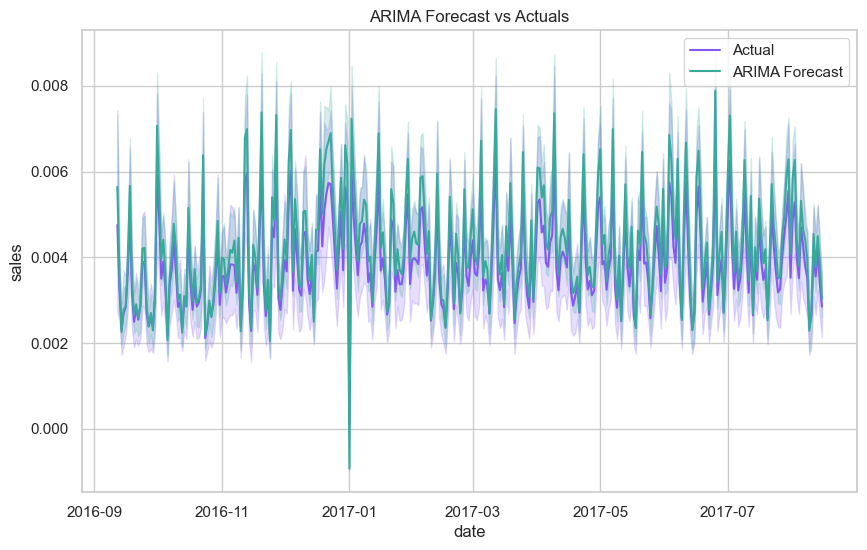

In [133]:
# Apply the function to plot the predictions vs actual
plot_predictions(train_test_data['date'],y_test, forecast_arima, 'ARIMA Forecast', 'ARIMA Forecast vs Actuals')

In [134]:
# Calcualte the metrics
arima_metrics = evaluate_forecast(y_test, forecast_arima)

# Print out
arima_metrics

{'MSE': 0.0001052455612623536,
 'RMSE': 0.010258925931224652,
 'RMSLE': 0.009960074815789408}

### EXPONENTIAL SMOOTHING MODEL
Exponential smoothing is a time series forecasting method that assigns exponentially decreasing weights to past observations. Exponential smoothing methods include simple exponential smoothing, Holt's linear exponential smoothing, and Holt-Winters exponential smoothing, which handles seasonality.

In [135]:
# Define Instance of the Exponential Smoothing model
model_ets = ExponentialSmoothing(y_train, seasonal='add', seasonal_periods=12)

# Fit the Model
results_ets = model_ets.fit()

# Make Initial Forecast
initial_forecast = results_ets.forecast(steps=len(y_test))

In [136]:
# Use initial forecast obtained and exogenous Variables defined to predict y_test.
X_adjust_train = pd.concat([y_train.shift(-1).dropna().rename("forecast"), X_train[ex_variables].iloc[1:, :]], axis=1)
X_adjust_test = pd.concat([pd.Series(initial_forecast, index=y_test.index).rename("forecast"), X_test[ex_variables]], axis=1)

# Drop rows with missing values from both the adjusted train and test
X_adjust_train = X_adjust_train.dropna()
y_adjust_train = y_train.loc[X_adjust_train.index]

X_adjust_test = X_adjust_test.dropna()
y_adjust_test = y_test.loc[X_adjust_test.index]

# Convert feature names to strings
X_adjust_train.columns = X_adjust_train.columns.astype(str)
X_adjust_test.columns = X_adjust_test.columns.astype(str)

In [137]:
# Define Linear Regression Model
lr = LinearRegression()

# Fit the model
lr.fit(X_adjust_train, y_adjust_train)

# Predict based on the X_adjusted_test
forecast_ets = lr.predict(X_adjust_test)

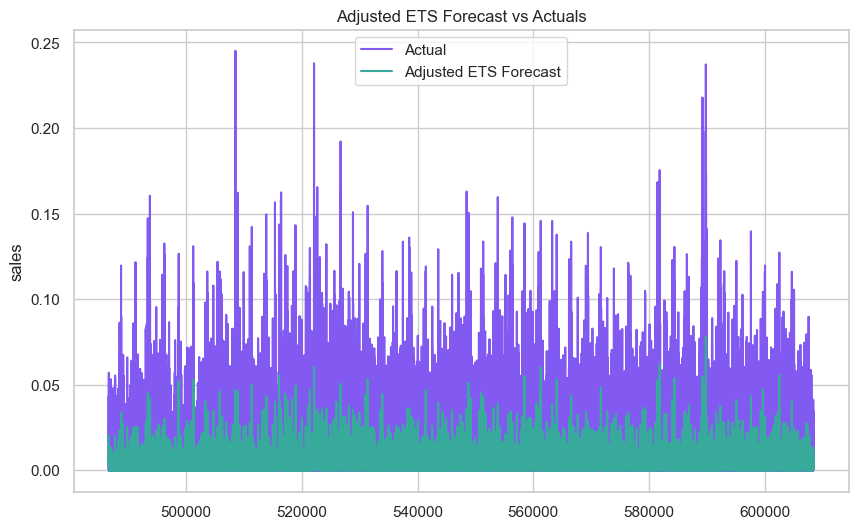

In [138]:
# Apply the function to plot the predictions vs actual
plot_predictions(y_adjust_test.index,y_adjust_test, forecast_ets, 'Adjusted ETS Forecast', 'Adjusted ETS Forecast vs Actuals')

In [139]:
# Calcualte the metrics
ets_metrics = evaluate_forecast(y_adjust_test, forecast_ets)

# Print out
ets_metrics

{'MSE': 9.736159391898346e-05,
 'RMSE': 0.009867197875738759,
 'RMSLE': 0.009537441891789759}

## XGBOOST REGRESSOR MODEL

In [140]:
# Define and configure the XGBoost model
model_xgboost = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3)

# Fit the XGBoost model
model_xgboost.fit(X_train, y_train)

# Make Predictions
forecast_xgboost = model_xgboost.predict(X_test)


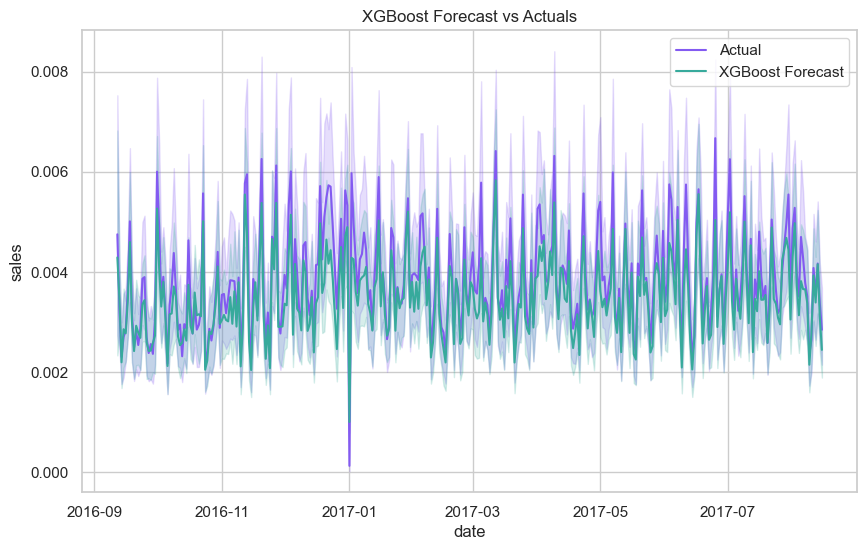

In [141]:
# Apply the function to plot the predictions vs actual
plot_predictions(train_test_data['date'],y_test, forecast_xgboost, 'XGBoost Forecast', 'XGBoost Forecast vs Actuals')

In [142]:
# Calcualte the metrics
xgboost_metrics = evaluate_forecast(y_test, forecast_xgboost)

# Print out
xgboost_metrics

{'MSE': 2.0760376827877646e-05,
 'RMSE': 0.004556355652040087,
 'RMSLE': 0.004329587003267946}

In [143]:
# Define the Model Instance
model_sarima = sm.tsa.SARIMAX(y_train, exog=X_train[ex_variables], order=(1,1,0), seasonal_order=(1,0,0,12))

# Fit the Model
results_sarima = model_sarima.fit(disp=False)

# Make Predictions
forecast_sarima = results_sarima.predict(start=len(train_data), end=len(train_data) + len(train_test_data) - 1, exog=X_test[ex_variables])

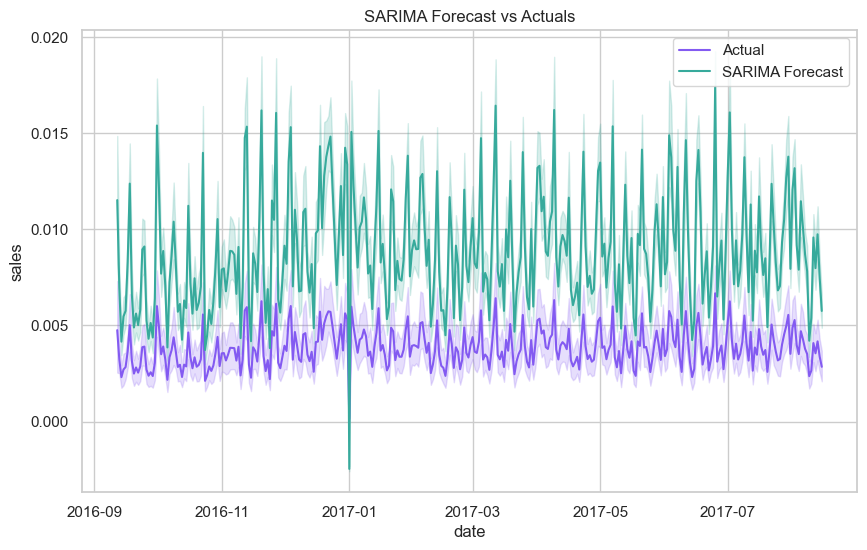

In [144]:
# Apply the function to plot the predictions vs actual
plot_predictions(train_test_data['date'],y_test, forecast_sarima, 'SARIMA Forecast', 'SARIMA Forecast vs Actuals')

In [145]:
# Calcualte the metrics
sarima_metrics = evaluate_forecast(y_test, forecast_sarima)

# Print out
sarima_metrics

{'MSE': 0.0002164989581635361,
 'RMSE': 0.014713903566475351,
 'RMSLE': 0.014304127715429155}

In [146]:
# Create a Dictionary to combine all the results of the models
data = {
    'Model': ['ARIMA', 'SARIMA', 'ETS', 'XGBOOST'],
    'MSE': [arima_metrics['MSE'], sarima_metrics['MSE'], ets_metrics['MSE'], xgboost_metrics['MSE']],
    'RMSE': [arima_metrics['RMSE'], sarima_metrics['RMSE'], ets_metrics['RMSE'], xgboost_metrics['RMSE']],
    'RMSLE': [arima_metrics['RMSLE'], sarima_metrics['RMSLE'], ets_metrics['RMSLE'], xgboost_metrics['RMSLE']]
}

# Create a Performance df
performance_df = pd.DataFrame(data)

# Display
performance_df

,Model,MSE,RMSE,RMSLE
0,ARIMA,0.000105,0.010259,0.009960
1,SARIMA,0.000216,0.014714,0.014304
2,ETS,0.000097,0.009867,0.009537
3,XGBOOST,0.000021,0.004556,0.004330


1. **MSE (Mean Squared Error)**: MSE measures the average squared difference between the predicted values and the actual values. It is commonly used to evaluate regression models. A lower MSE indicates a better fit to the data.

2. **RMSE (Root Mean Squared Error)**: RMSE is the square root of the MSE. It provides a measure of the average magnitude of the errors in the same units as the target variable. Like MSE, lower RMSE values indicate better model performance.

3. **RMSLE (Root Mean Squared Logarithmic Error)**: RMSLE is a variation of RMSE that is often used when dealing with skewed or non-normally distributed target variables. It calculates the RMSE of the logarithm of the predicted and actual values. RMSLE is particularly useful when the target variable has a wide range, and the errors are expected to be proportional to the actual values. Lower RMSLE values indicate better performance, similar to RMSE.

Now, MAE (Mean Absolute Error) is greater than all of these metrics because MAE measures the average absolute difference between the predicted values and the actual values. It is less sensitive to outliers compared to MSE and RMSE. In some cases, MAE can be greater than MSE and RMSE because it does not penalize larger errors as significantly.

In [147]:
# Plot the performance 
fig = px.bar(performance_df, x='Model', y='RMSLE', title='RMSLE by Model', height=600)
fig.update_xaxes(title='Model')
fig.update_yaxes(title='RMSLE')
fig.update_xaxes(categoryorder='total ascending')

# Add data labels on top of the bars
fig.update_traces(texttemplate='%{y}', textposition='outside')

# Show plot
fig.show()

# HYPERPARAMETER TUNING

In [148]:


# Define the parameter grid to search
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    # Add other hyperparameters you want to tune here
}

# Create the XGBoost model
model_xgboost = xgb.XGBRegressor(objective='reg:squarederror')

# Create the GridSearchCV object
grid_search = GridSearchCV(model_xgboost, param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)

# Fit the grid search to your training data
grid_search.fit(X_train, y_train)

# Get the best hyperparameters and the best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Make predictions with the best model
forecast_xgboost = best_model.predict(X_test)



In [149]:
# Calculate Evaluation Metrics
xgb_best = evaluate_forecast(y_test, forecast_xgboost)

# Print
xgb_best

{'MSE': 1.238854041123588e-05,
 'RMSE': 0.003519735843957026,
 'RMSLE': 0.0033076822502267175}

## Predicting on the Test Data

In [150]:
test_data.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [151]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           28512 non-null  int64 
 1   date         28512 non-null  object
 2   store_nbr    28512 non-null  int64 
 3   family       28512 non-null  object
 4   onpromotion  28512 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 1.1+ MB


In [152]:
test_data.shape

(28512, 5)

In [153]:
# Rename the 'family' column
test_data.rename(columns={'family': 'Product'}, inplace=True)

# Rename the 'date' column
test_data.rename(columns={'date': 'Date'}, inplace=True)

In [154]:
# Merge stores_data based on 'store_nbr'
test_m = pd.merge(test_data , stores_data, on='store_nbr', how='left')

In [155]:
test_m.head()

,id,Date,store_nbr,Product,onpromotion,city,state,Store Type,cluster
0,3000888,2017-08-16,1,AUTOMOTIVE,0,Quito,Pichincha,D,13
1,3000889,2017-08-16,1,BABY CARE,0,Quito,Pichincha,D,13
2,3000890,2017-08-16,1,BEAUTY,2,Quito,Pichincha,D,13
3,3000891,2017-08-16,1,BEVERAGES,20,Quito,Pichincha,D,13
4,3000892,2017-08-16,1,BOOKS,0,Quito,Pichincha,D,13


In [156]:
# transc_data['date'] = pd.to_datetime(transc_data['date'], format='%Y-%m-%d')
test_m['Date'] = pd.to_datetime(test_m['Date'], format='%Y-%m-%d', errors='coerce')

# Reset the index of 'transc_data' so that 'date' becomes a column
test_m.reset_index(inplace=False)

,index,id,Date,store_nbr,Product,onpromotion,city,state,Store Type,cluster
0,0,3000888,2017-08-16,1,AUTOMOTIVE,0,Quito,Pichincha,D,13
1,1,3000889,2017-08-16,1,BABY CARE,0,Quito,Pichincha,D,13
2,2,3000890,2017-08-16,1,BEAUTY,2,Quito,Pichincha,D,13
3,3,3000891,2017-08-16,1,BEVERAGES,20,Quito,Pichincha,D,13
4,4,3000892,2017-08-16,1,BOOKS,0,Quito,Pichincha,D,13
...,...,...,...,...,...,...,...,...,...,...
28507,28507,3029395,2017-08-31,9,POULTRY,1,Quito,Pichincha,B,6
28508,28508,3029396,2017-08-31,9,PREPARED FOODS,0,Quito,Pichincha,B,6
28509,28509,3029397,2017-08-31,9,PRODUCE,1,Quito,Pichincha,B,6
28510,28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9,Quito,Pichincha,B,6


In [157]:
# Convert onpromotion to int
test_m['onpromotion'] = test_m['onpromotion'].astype('int')

In [158]:
train_m_agg = test_m.groupby(['Date', 'store_nbr', 'Product', 'cluster' ]).agg({ 'onpromotion': 'sum' }).reset_index()

In [159]:
train_m_agg.isna().sum()

Date           0
store_nbr      0
Product        0
cluster        0
onpromotion    0
dtype: int64

In [160]:
# Create day of the week feature
train_m_agg['day_of_week'] = train_m_agg['Date'].dt.dayofweek


In [161]:

# The lag cannot be computed here because there is no previous data
train_m_agg['lag_1'] = 0
#train_m_agg['sales_lag_2'] = 0
# Same applies to the rolling mean
train_m_agg['rolling_mean'] = 0
#train_m_agg['rolling_std'] = 0

In [162]:
train_m_agg.head()

,Date,store_nbr,Product,cluster,onpromotion,day_of_week,lag_1,rolling_mean
0,2017-08-16,1,AUTOMOTIVE,13,0,2,0,0
1,2017-08-16,1,BABY CARE,13,0,2,0,0
2,2017-08-16,1,BEAUTY,13,2,2,0,0
3,2017-08-16,1,BEVERAGES,13,20,2,0,0
4,2017-08-16,1,BOOKS,13,0,2,0,0


In [163]:
# Assuming train_m_agg is your DataFrame
train_m_agg.rename(columns={'Date': 'date'}, inplace=True)


In [165]:
# Assuming you have 'data', 'numeric_features', and 'categorical_features' defined somewhere before calling the function

# Exclude 'sales' column from numeric features
numeric_features = [col for col in numeric_features if col != 'sales']

# Encode categorical features and scale numerical features
test_enc = encode_features(train_m_agg, numeric_features, categorical_features)


In [166]:
test_enc

,date,Product_BABY CARE,Product_BEAUTY,Product_BEVERAGES,Product_BOOKS,Product_BREAD/BAKERY,Product_CELEBRATION,Product_CLEANING,Product_DAIRY,Product_DELI,...,Product_POULTRY,Product_PREPARED FOODS,Product_PRODUCE,Product_SCHOOL AND OFFICE SUPPLIES,Product_SEAFOOD,store_nbr,cluster,day_of_week,lag_1,rolling_mean
0,2017-08-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.750,0.333333,0.0,0.0
1,2017-08-16,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.750,0.333333,0.0,0.0
2,2017-08-16,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.750,0.333333,0.0,0.0
3,2017-08-16,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.750,0.333333,0.0,0.0
4,2017-08-16,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.750,0.333333,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28507,2017-08-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.125,0.500000,0.0,0.0
28508,2017-08-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.125,0.500000,0.0,0.0
28509,2017-08-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.125,0.500000,0.0,0.0
28510,2017-08-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.125,0.500000,0.0,0.0


In [167]:
# X_train features 
X_train_features = X_train.columns.to_list()

# Values to forecast
test_pred = test_enc[X_train_features]

In [168]:
prediction_t = best_model.predict(test_pred)

In [169]:
# Create a DataFrame for test predictions
prediction_df = pd.DataFrame({'Index': test_pred.index, 'Predicted_Sales': prediction_t})

# Optionally, set the 'Index' column as the DataFrame index
prediction_df.set_index('Index', inplace=True)

# Print or display the prediction DataFrame
prediction_df


,Predicted_Sales
Index,
0,-0.000068
1,-0.000053
2,-0.000111
3,0.001560
4,-0.000121
...,...
28507,-0.000206
28508,0.000141
28509,-0.000155
